In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

Using TensorFlow backend.
W0401 21:14:42.943690 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0401 21:14:42.950935 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

W0401 21:14:42.952035 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:186: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

W0401 21:14:43.438229 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:190: The name tf.global_variables is deprecated. Please 

['/job:localhost/replica:0/task:0/device:GPU:0']

In [3]:
import os
import datetime
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from time import time
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from matplotlib.patches import Rectangle

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import xml.etree.ElementTree as et

class AnnotationParser():
    """
    The desired labels are: (l_toe, l_ankle, l_knee, l_hip, r_toe, r_ankle, r_knee, r_hip), and activity 
    with attribute activity type radio button with values: walking, standing, running, none.
    
    Example:
    --------
    >>> annotation_file_name = "../data/lore/lore.xml"
    >>> annotation_parser = AnnotationParser()
    >>> annotation_df = annotation_parser.parse(annotation_file_name=annotation_file_name)
    >>> # Showing Markers on image
    >>> # Get general video info
    >>> video_file_name = "../data/lore/lore.mp4"
    >>> cap = cv2.VideoCapture(video_file_name)
    >>> fps = cap.get(cv2.CAP_PROP_FPS)
    >>> frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    >>> cap.set(cv2.CAP_PROP_POS_AVI_RATIO,1)
    >>> video_duration = cap.get(cv2.CAP_PROP_POS_MSEC)
    >>> # Extract specific frame
    >>> frame_counter = 991
    >>> annotation_subset = annotation_df.loc[annotation_df['frame']==frame_counter]
    >>> cap = cv2.VideoCapture(video_file_name)
    >>> cap.set(cv2.CAP_PROP_POS_FRAMES, frame_counter-1)
    >>> ret, frame = cap.read()
    >>> if ret == True:
    >>>     frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    >>> # Showing Image
    >>> plt.figure()
    >>> plt.imshow(frame)
    >>> plt.plot(annotation_subset['x_coord'],annotation_subset['y_coord'],'*')
    >>> plt.title(annotation_subset.iloc[0]['activity'])
    """
    def __init__(self):
        pass
        
    def parse(self, annotation_file_name):
        xtree = et.parse(annotation_file_name)
        self.xroot = xtree.getroot()
        annotations = self.parse_joints()
        self.activity_markers = self.parse_activities()
        coords = annotations.apply(lambda x: self.compute_coords(x),axis=1)
        annotations = pd.concat([annotations,coords], axis=1)
        annotations['activity'] = annotations['frame'].apply(self.return_activity)
        return annotations
    
    def parse_joints(self):
        annotations = []
        for node in self.xroot.findall("track"):
            annotation_id = node.attrib.get("id")
            annotation_label = node.attrib.get("label")
            boxes = node.findall("box")
            if node.attrib['label']!='activity':
                for box in boxes:
                    annotations.append({**box.attrib,"category_id":annotation_id,"label":annotation_label})
        annotations = pd.DataFrame(annotations)
        annotations[['frame']] = annotations[['frame']].astype(int)
        annotations[['xbr','xtl','ybr','ytl']] = annotations[['xbr','xtl','ybr','ytl']].astype(float)
        return annotations
   
    def parse_activities(self):
        activity_markers = []
        for node in self.xroot.findall("track"):
            annotation_id = node.attrib.get("id")
            annotation_label = node.attrib.get("label")
            boxes = node.findall("box")
            if node.attrib['label']=='activity':
                for box in boxes:
                    box.findall('attribute')
                    activity_markers.append({'frame':box.attrib['frame'],'activity':box.findall('attribute')[0].text})        
        activity_markers = pd.DataFrame(activity_markers)
        activity_markers[['frame']] = activity_markers[['frame']].astype(int)
        activity_markers.sort_values('frame',inplace=True)
        return activity_markers
    
    def return_activity(self, frame):
        activity_index =  (self.activity_markers['frame'].values <= frame).sum() - 1
        activity = self.activity_markers.iloc[activity_index]['activity']
        activity = pd.Series(activity)
        return activity
    
    def compute_coords(self, x):
        result = pd.Series({'x_coord':(0.5*x['xbr']+0.5*x['xtl']),'y_coord':(0.5*x['ybr']+0.5*x['ytl'])})
        return result
    
    def parse_activities_only(self, annotation_file_name):
        xtree = et.parse(annotation_file_name)
        self.xroot = xtree.getroot()
        activity_markers = self.parse_activities()
        return  activity_markers

In [5]:
import sys
sys.path.append('/home/jovyan/work/darkflow')
from darkflow.net.build import TFNet
from time import time

class Yolo:
    """
    Example:
    --------
    base_path = "../data/lore"
    filename = "lore_109.jpg"
    yolo_detector = Yolo()
    image_path = "{}/{}".format(base_path, filename)
    imgcv = cv2.imread(image_path)
    
    # draw boxes
    yolo_detector.draw_boxes(imgcv)
    # extract input X
    X, width_scale, height_scale, cutting_rect = yolo_detector.extract_person(imgcv)
    plt.figure()
    plt.imshow(cv2.cvtColor(img_to_array(X)/255, cv2.COLOR_BGR2RGB))
    """
    def __init__(self):
        options = {"model": "../darkflow/cfg/yolov2-tiny.cfg", 
           "load": "../darkflow/bin/yolov2-tiny.weights", 
           "threshold": 0.001,
           "config":"../darkflow/cfg/"} 
        self.tfnet = TFNet(options)
    
    def filter_people(self, imgcv):
        result = self.detect(imgcv)
        result_df=pd.DataFrame(result)
        people_mask=result_df['label']=='person'
        people_df = result_df.loc[people_mask]
        return people_df
        
    def detect(self, imgcv):
        result = self.tfnet.return_predict(imgcv)
        return result
    
    def draw_boxes(self, imgcv):
        people_df = self.filter_people(imgcv)
        im_rgb = cv2.cvtColor(imgcv, cv2.COLOR_BGR2RGB)
        fig = plt.figure()
        plt.imshow(im_rgb)
        ax = plt.gca()
        # draw boxes
        for i in range(people_df.shape[0]):
            # draw one box
            person_result = people_df.iloc[i]
            width = person_result["bottomright"]['x'] - person_result["topleft"]['x']
            height = person_result["bottomright"]['y'] - person_result["topleft"]['y']
            rect = Rectangle((person_result["topleft"]['x'],person_result["topleft"]['y']), width, height, fill=False, color='green')
            ax.add_patch(rect)
            label = "%s (%.3f)" % (person_result['label'], person_result['confidence'])
            plt.text(person_result["topleft"]['x'], person_result["topleft"]['y'], label, color='green')
        # Plotting the maximum rect in blue
        person_result = people_df.loc[people_df['confidence'] == people_df['confidence'].max()].iloc[0]
        width = person_result["bottomright"]['x'] - person_result["topleft"]['x']
        height = person_result["bottomright"]['y'] - person_result["topleft"]['y']
        rect = Rectangle((person_result["topleft"]['x'],person_result["topleft"]['y']), width, height, fill=False, color='blue')
        ax.add_patch(rect)
        label = "%s (%.3f)" % (person_result['label'], person_result['confidence'])
        plt.text(person_result["topleft"]['x'], person_result["topleft"]['y'], label, color='blue')
    
    def extract_person(self, imgcv, target_width=192, target_height=256):
        img = array_to_img(imgcv)
        people_df = self.filter_people(imgcv)
        people_series = people_df.loc[people_df['confidence'] == people_df['confidence'].max()].iloc[0]
        x = np.array([people_series['topleft']['x'],people_series['bottomright']['x']])
        y = np.array([people_series['topleft']['y'],people_series['bottomright']['y']])
        x = np.minimum(np.maximum((2*(x - np.mean(x)) + np.mean(x)).astype('int'),0),img.size[0])
        y = np.minimum(np.maximum((1.5*(y - np.mean(y)) + np.mean(y)).astype('int'),0),img.size[1])
        cutting_rect = [x[0],y[0],x[1],y[1]]
        X = img.crop(cutting_rect)
        width_scale, height_scale = target_width/X.size[0], target_height/X.size[1]
        X = X.resize((target_width,target_height))
        return X, width_scale, height_scale, cutting_rect

W0401 21:14:50.157627 47986160213696 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W0401 21:14:51.458466 47986160213696 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/build.py:15: The name tf.train.RMSPropOptimizer is deprecated. Please use tf.compat.v1.train.RMSPropOptimizer instead.

W0401 21:14:51.460043 47986160213696 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/build.py:16: The name tf.train.AdadeltaOptimizer is deprecated. Please use tf.compat.v1.train.AdadeltaOptimizer instead.

W0401 21:14:51.461114 47986160213696 module_wrapper.py:139] From /project/6014087/jchaconl/proj

In [6]:
class FrameExtractor():
    '''
    Class used for extracting frames from a video file.
    '''
    def __init__(self, video_path):
        self.video_path = video_path
        self.vid_cap = cv2.VideoCapture(video_path)
        self.n_frames = int(self.vid_cap.get(cv2.CAP_PROP_FRAME_COUNT))
        self.fps = int(self.vid_cap.get(cv2.CAP_PROP_FPS))
        self.yolo_detector = None
        
    def get_video_duration(self):
        duration = self.n_frames/self.fps
        print('Duration: {}'.format(datetime.timedelta(seconds=duration)))
        
    def get_n_images(self, every_x_frame):
        n_images = math.floor(self.n_frames / every_x_frame) + 1
        print('Extracting every {} (nd/rd/th) frame would result in {} images.'.format(every_x_frame,n_images))
        
    def extract_frames(self, every_x_frame, img_name, dest_path=None, img_ext = '.jpg'):
        if not self.vid_cap.isOpened():
            self.vid_cap = cv2.VideoCapture(self.video_path)
        
        if dest_path is None:
            dest_path = os.getcwd()
        else:
            if not os.path.isdir(dest_path):
                os.mkdir(dest_path)
                print('Created the following directory: {}'.format(dest_path))
        
        frame_cnt = 0
        img_cnt = 0

        while self.vid_cap.isOpened():
            
            success, image = self.vid_cap.read() 
            
            if not success:
                break
            
            if frame_cnt % every_x_frame == 0:
                img_path = os.path.join(dest_path, ''.join([img_name, '_', str(img_cnt), img_ext]))
                cv2.imwrite(img_path, image)  
                img_cnt += 1
                
            frame_cnt += 1
        
        self.vid_cap.release()
        
    def extract_frame_list(self, frame_counters, dest_path='.', img_name=None, img_ext='.jpg'):
        if not self.vid_cap.isOpened():
            self.vid_cap = cv2.VideoCapture(self.video_path)
        
        if dest_path is None:
            dest_path = os.getcwd()
        else:
            if not os.path.isdir(dest_path):
                os.mkdir(dest_path)
                print('Created the following directory: {}'.format(dest_path))
        
        for frame_counter in frame_counters:
            self.vid_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_counter)
            ret, image = self.vid_cap.read()
            img_path = os.path.join(dest_path, ''.join([img_name, '_', str(frame_counter), img_ext]))
            cv2.imwrite(img_path, image)
            
    def extract_person_from_frame_list(self, frame_counters, dest_path='.', img_name=None, img_ext='.jpg'):
        if not self.yolo_detector:
            self.yolo_detector = Yolo()
        
        if not self.vid_cap.isOpened():
            self.vid_cap = cv2.VideoCapture(self.video_path)
        
        if dest_path is None:
            dest_path = os.getcwd()
        else:
            if not os.path.isdir(dest_path):
                os.mkdir(dest_path)
                print('Created the following directory: {}'.format(dest_path))
        
        cutting_details = []
        for frame_counter in frame_counters:
            try:
                self.vid_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_counter)
                ret, image = self.vid_cap.read()
                X, width_scale, height_scale, cutting_rect = self.yolo_detector.extract_person(imgcv=image)
                img_path = os.path.join(dest_path, ''.join([img_name, '_', str(frame_counter), img_ext]))
                cv2.imwrite(img_path, img_to_array(X))
                video_name = os.path.basename(self.video_path)
                cutting_details.append({"video_name":video_name,
                                        "frame":frame_counter,
                                        "width_scale": width_scale, 
                                        "height_scale": height_scale, 
                                        "cutting_rect": cutting_rect})
            except:
                print('Not person detected, video path: {}, frame: {}'.format(self.video_path, frame_counter))
                cutting_details.append({"video_name":video_name,
                        "frame":frame_counter,
                        "width_scale": None, 
                        "height_scale": None, 
                        "cutting_rect": None})
                
        return cutting_details

**Note!!!** The data generator will be pending as I will see if the model is able to train with the existing images, follow [[keras cats dogs]](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html) [[writing generators]](https://stackoverflow.com/questions/56758592/how-to-customize-imagedatagenerator-in-order-to-modify-the-target-variable-value/56762694)

The keras image iterator is a convenient keras sequence, [here](https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly) you can find a guide of how to implement them.

In [7]:
from time import time
import numpy as np
import keras
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from mpii_utils import parse_mpii

class DataGenerator(keras.utils.Sequence):
    """Generates data for Keras
    Example:
    --------
    >>> from sklearn.model_selection import train_test_split
    >>> data_names = data_names_df.apply(lambda x:"{}_{}.jpg".format(x['video_name'].split('.')[0],x['frame']),axis=1).values
    >>> list_IDs_train, list_IDs_test = train_test_split(data_names, test_size=0.15)
    >>> params = {'dim_input': (256, 192),
    >>>       'dim_output': (78, 62),
    >>>       'batch_size': 32,
    >>>       'n_channels_input': 3,
    >>>       'n_channels_output': 8,
    >>>       'shuffle': True}
    >>> # Generators
    >>> path_to_images = '../data_rf/images'
    >>> training_generator = DataGenerator(list_IDs=list_IDs_train, annotations_df=annotations_df,
    >>>                                    cutting_details_df = cutting_details_df,
    >>>                                    path_to_images=path_to_images, **params)
    >>> validation_generator = DataGenerator(list_IDs=list_IDs_test, annotations_df=annotations_df,
    >>>                                    cutting_details_df = cutting_details_df,
    >>>                                    path_to_images=path_to_images, **params)
    >>> # Getting the first Generator Batch
    >>> for i in range(1):
    >>>     X,Y = training_generator.__getitem__(i)
    >>>     for sample_ind in range(30):
    >>>         f, ax = plt.subplots(2,4,figsize=(16,8))
    >>>         for joint_ind in range(8):
    >>>             XX = cv2.resize(X[sample_ind,:,:,:], dsize=(62,78), interpolation=cv2.INTER_CUBIC)
    >>>             ax[joint_ind//4][joint_ind%4].imshow(XX)
    >>>             ax[joint_ind//4][joint_ind%4].imshow(Y[sample_ind,:,:,joint_ind],alpha=0.5)
    >>>             ax[joint_ind//4][joint_ind%4].set_title('{}'.format(training_generator.ORDERED_LABELS[joint_ind]))
    >>>         plt.show()
    """
    def __init__(self, list_IDs, annotations_df, cutting_details_df, path_to_images, batch_size=32, dim_input=(256, 192),
                 dim_output=(78, 62), n_channels_input=3,n_channels_output=8, shuffle=True):
        'Initialization'
        self.list_IDs = list_IDs
        self.annotations_df = annotations_df
        self.cutting_details_df = cutting_details_df
        self.path_to_images = path_to_images
        self.batch_size = batch_size
        self.dim_input = dim_input
        self.dim_output = dim_output
        self.n_channels_input = n_channels_input
        self.n_channels_output = n_channels_output
        self.shuffle = shuffle
        self.on_epoch_end()
        self.ORDERED_LABELS = ['r_toe','l_toe','r_ankle','l_ankle','r_knee','l_knee','r_hip','l_hip']

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        # Generate data
        X, Y = self.__data_generation(list_IDs_temp)

        return X, Y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim_input, self.n_channels_input))
        Y = np.empty((self.batch_size, *self.dim_output, self.n_channels_output))

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Getting X            
            video_name, frame = ID.split('.')[:-1][0].split('_')
            image_path = "{}/{}".format(self.path_to_images, ID)
            XX = img_to_array(load_img(image_path))/255
            # Getting Heat Maps
            annotation = self.annotations_df.loc[(self.annotations_df['video_name']=='{}.mp4'.format(video_name))
                                           & (self.annotations_df['frame']==int(frame))]
            cutting_details = self.cutting_details_df.loc[(self.cutting_details_df['video_name']=='{}.mp4'.format(video_name))
                                           & (self.cutting_details_df['frame']==int(frame))]
            width_scale = cutting_details['width_scale'].iloc[0]
            height_scale = cutting_details['height_scale'].iloc[0]
            cutting_rect = cutting_details['cutting_rect'].iloc[0]
            joint_coords_df = annotation.set_index('label').loc[self.ORDERED_LABELS]
            joint_coords = joint_coords_df[['x_coord','y_coord']].values
            ## fixing the joint_coords after croping
            joint_coords = joint_coords - cutting_rect[:2]
            ## fixing the joint_coords after resizing
            joint_coords = np.dot(joint_coords, np.diag([width_scale, height_scale]))
            joint_coords = joint_coords.astype(int)
            # Store input
            X[i,] = XX
            # Store output
            Y[i,] = self.get_heat_maps(joint_coords)

        return X, Y
    
    def get_heat_maps(self, y, img_width=192, img_height=256, hmap_width=62, hmap_height=78):
        """
        Returns the 2D heatmaps associated to the coordinates specified in the rows of y, keeping the proportions
        from image to heatmap.

        Example:
        --------
        >>> joint_count = 2
        >>> y = np.hstack([np.random.randint(low=1,high=img_height,size=(joint_count,1)),
                   np.random.randint(low=1,high=img_width,size=(joint_count,1))])
        >>> H = get_heat_maps(y)
        >>> for i in range(y.shape[0]):
        >>>     plt.figure()
        >>>     plt.imshow(H[:,:,i])
        """
        joint_count = y.shape[0]
        width_scale = hmap_width/img_width;
        height_scale = hmap_height/img_height;
        xh, xw = np.meshgrid(range(hmap_height),range(hmap_width))
        H = np.zeros((hmap_height, hmap_width, joint_count))
        for joint_index in range(joint_count):
            std_h = 4*height_scale
            std_w = 4*width_scale
            H[:,:,joint_index] = np.exp(-((xh-height_scale*y[joint_index,1])/std_h)**2
                                        -((xw-width_scale*y[joint_index,0])/std_w)**2).T
        return H

In [8]:
from keras.preprocessing.image import Iterator, ImageDataGenerator
import re

class PoseIterator(Iterator):

    def __init__(self, list_IDs, annotations_df, cutting_details_df, path_to_images, 
                 batch_size=32,dim_input=(256, 192), dim_output=(78, 62), n_channels_input=3, 
                 n_channels_output=8, shuffle=True, seed=0, **kwargs):
        
        """
        Example
        -------
        >>> from sklearn.model_selection import train_test_split
        >>> data_names = data_names_df.apply(lambda x:"{}_{}.jpg".format(x['video_name'].split('.')[0],x['frame']),axis=1).values
        >>> list_IDs_train, list_IDs_test = train_test_split(data_names, test_size=0.15)
        >>> image_data_generator_params ={
        >>>     "featurewise_center":True,
        >>>     "featurewise_std_normalization":True,
        >>>     "rotation_range":5,
        >>>     "width_shift_range":0.1,
        >>>     "height_shift_range":0,
        >>>     "horizontal_flip":True}
        >>> iterator_params = {'dim_input': (256, 192),
        >>>                    'dim_output': (78, 62),
        >>>                    'batch_size': 32,
        >>>                    'n_channels_input': 3,
        >>>                    'n_channels_output': 8,
        >>>                    'shuffle': True}
        >>> path_to_images='../data_rf/images/'
        >>> it = PoseIterator(list_IDs_train, annotations_df, cutting_details_df, path_to_images, 
        >>>                  batch_size=32,dim_input=(256, 192), dim_output=(78, 62), n_channels_input=3, 
        >>>                  n_channels_output=8, shuffle=True, seed=0, **image_data_generator_params)
        >>> X,Y = it.next()
        >>> for sample_ind in range(32):
        >>>     f, ax = plt.subplots(2,4,figsize=(16,8))
        >>>     for joint_ind in range(8):
        >>>         XX = cv2.resize(X[sample_ind,:,:,:], dsize=(62,78), interpolation=cv2.INTER_CUBIC)
        >>>         ax[joint_ind//4][joint_ind%4].imshow(XX)
        >>>         ax[joint_ind//4][joint_ind%4].imshow(Y[sample_ind,:,:,joint_ind],alpha=0.5)
        >>>         ax[joint_ind//4][joint_ind%4].set_title('{}'.format(it.ORDERED_LABELS[joint_ind]))
        >>>     plt.show()
        """
        n = len(list_IDs)
        super().__init__(n, batch_size, shuffle, seed)
    
        self.list_IDs = list_IDs
        self.annotations_df = annotations_df
        self.cutting_details_df = cutting_details_df
        self.path_to_images = path_to_images
        self.batch_size = batch_size
        self.dim_input = dim_input
        self.dim_output = dim_output
        self.n_channels_input = n_channels_input
        self.n_channels_output = n_channels_output
        self.shuffle = shuffle
        self.on_epoch_end()
        self.ORDERED_LABELS = ['r_toe','l_toe','r_ankle','l_ankle','r_knee','l_knee','r_hip','l_hip']
    
        # Here is our beloved image augmentator <3
        self.generator = ImageDataGenerator(**kwargs)
    
    def _get_batches_of_transformed_samples(self, index_array):
        """Gets a batch of transformed samples from array of indices"""
        
        batch_x = np.empty((self.batch_size, *self.dim_input, self.n_channels_input))
        batch_y = np.empty((self.batch_size, *self.dim_output, self.n_channels_output))
    
        ## Generate data
        list_IDs_temp = self.list_IDs[index_array]
        for i, ID in enumerate(list_IDs_temp):
            # Getting X            
            line = ID.split('.')[:-1][0]
            regex_video = re.compile(r'_\d+$')
            regex_frame = re.compile(r'_')
            video_name = regex_video.split(line)[0]
            frame = regex_frame.split(line)[-1]
            image_path = "{}/{}".format(self.path_to_images, ID)
            XX = img_to_array(load_img(image_path))/255
            # Getting Heat Maps
            annotation = self.annotations_df.loc[(self.annotations_df['video_name']=='{}.mp4'.format(video_name))
                                           & (self.annotations_df['frame']==int(frame))]
            cutting_details = self.cutting_details_df.loc[(self.cutting_details_df['video_name']=='{}.mp4'.format(video_name))
                                           & (self.cutting_details_df['frame']==int(frame))]
            width_scale = cutting_details['width_scale'].iloc[0]
            height_scale = cutting_details['height_scale'].iloc[0]
            cutting_rect = cutting_details['cutting_rect'].iloc[0]
            joint_coords_df = annotation.set_index('label').loc[self.ORDERED_LABELS]
            joint_coords = joint_coords_df[['x_coord','y_coord']].values
            ## fixing the joint_coords after croping
            joint_coords = joint_coords - cutting_rect[:2]
            ## fixing the joint_coords after resizing
            joint_coords = np.dot(joint_coords, np.diag([width_scale, height_scale]))
            joint_coords = joint_coords.astype(int)
            # Store input
            batch_x[i,] = XX
            # Store output
            batch_y[i,] = self.get_heat_maps(joint_coords)
        
        # Transform the inputs and correct the outputs accordingly
        for i, (x, y) in enumerate(zip(batch_x, batch_y)):           
            transform_params = self.generator.get_random_transform(x.shape)
            batch_x[i] = self.generator.apply_transform(x, transform_params)
            y = cv2.resize(y, dsize=(self.dim_input[1],self.dim_input[0]), interpolation=cv2.INTER_CUBIC)
            y = self.generator.apply_transform(y, transform_params)
            batch_y[i] = cv2.resize(y, dsize=(self.dim_output[1],self.dim_output[0]), interpolation=cv2.INTER_CUBIC)
                
        return batch_x, batch_y
    
    def get_heat_maps(self, y, img_width=192, img_height=256, hmap_width=62, hmap_height=78):
        """
        Returns the 2D heatmaps associated to the coordinates specified in the rows of y, keeping the proportions
        from image to heatmap.

        Example:
        --------
        >>> joint_count = 2
        >>> y = np.hstack([np.random.randint(low=1,high=img_height,size=(joint_count,1)),
                   np.random.randint(low=1,high=img_width,size=(joint_count,1))])
        >>> H = get_heat_maps(y)
        >>> for i in range(y.shape[0]):
        >>>     plt.figure()
        >>>     plt.imshow(H[:,:,i])
        """
        joint_count = y.shape[0]
        width_scale = hmap_width/img_width;
        height_scale = hmap_height/img_height;
        xh, xw = np.meshgrid(range(hmap_height),range(hmap_width))
        H = np.zeros((hmap_height, hmap_width, joint_count))
        for joint_index in range(joint_count):
            std_h = 4*height_scale
            std_w = 4*width_scale
            H[:,:,joint_index] = np.exp(-((xh-height_scale*y[joint_index,1])/std_h)**2
                                        -((xw-width_scale*y[joint_index,0])/std_w)**2).T
        return H

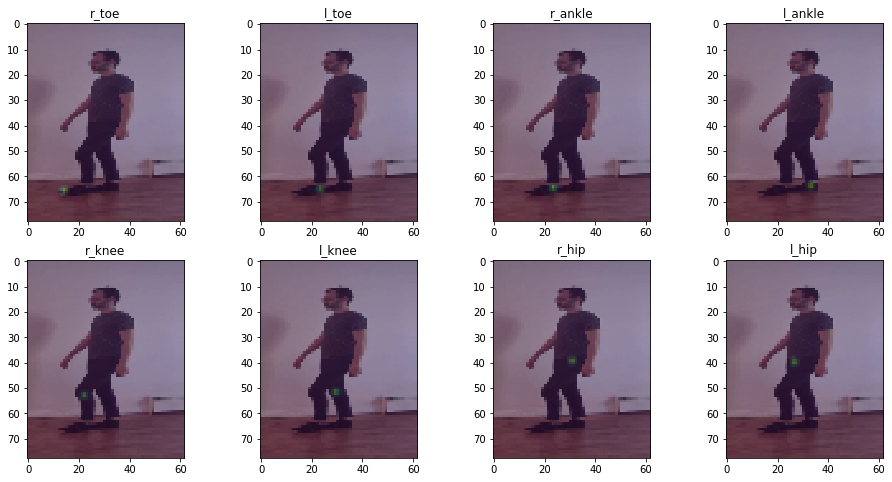

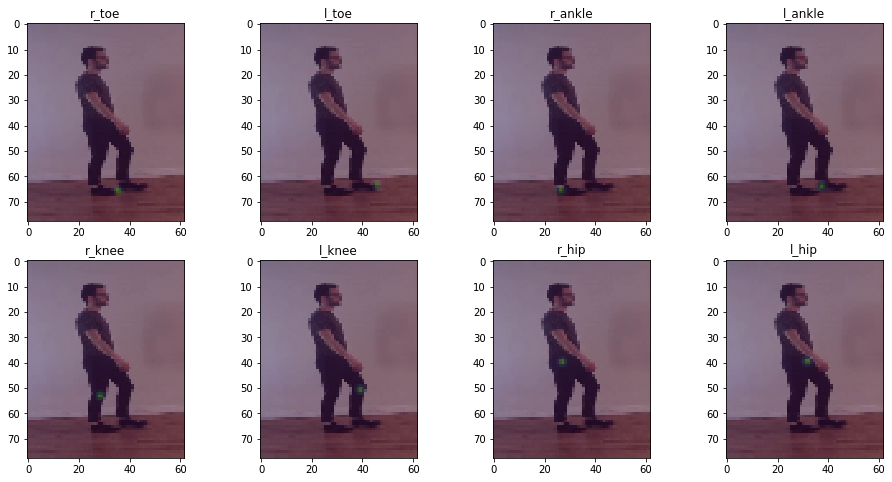

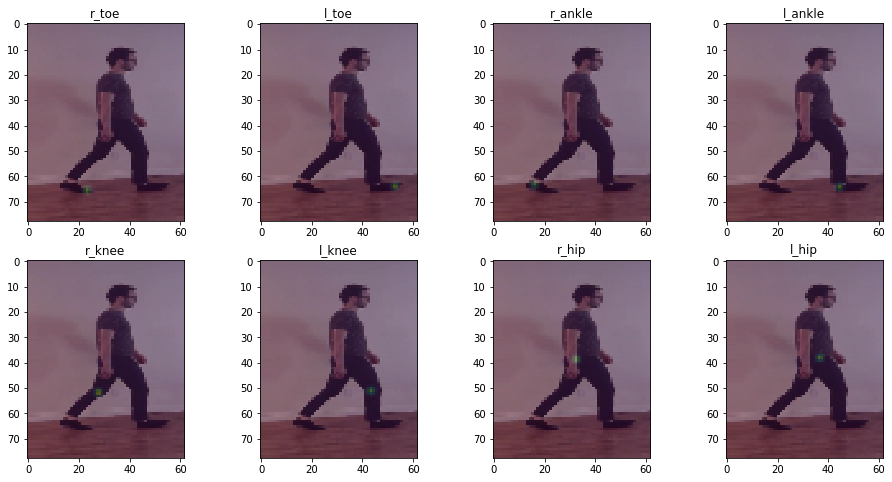

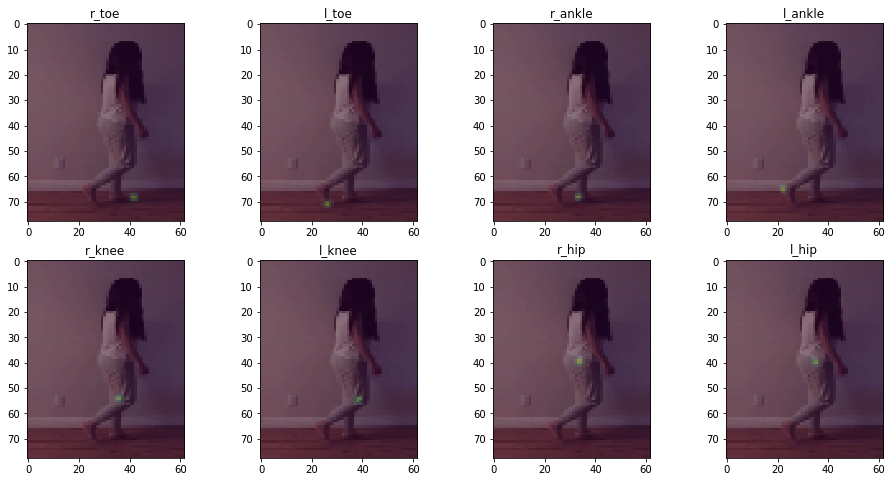

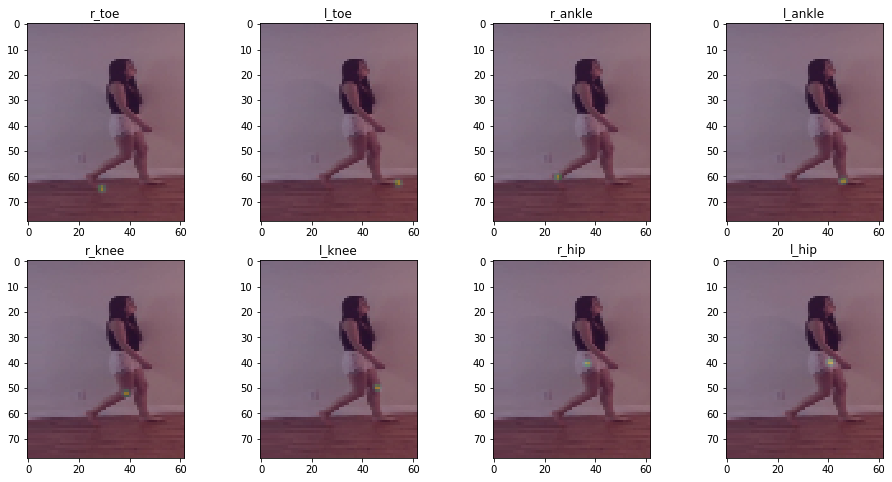

KeyboardInterrupt: 

In [32]:
        >>> from sklearn.model_selection import train_test_split
        >>> data_names = data_names_df.apply(lambda x:"{}_{}.jpg".format(x['video_name'].split('.')[0],x['frame']),axis=1).values
        >>> list_IDs_train, list_IDs_test = train_test_split(data_names, test_size=0.15)
        >>> image_data_generator_params ={
        >>>     "featurewise_center":True,
        >>>     "featurewise_std_normalization":True,
        >>>     "rotation_range":5,
        >>>     "width_shift_range":0.1,
        >>>     "height_shift_range":0,
        >>>     "horizontal_flip":True}
        >>> iterator_params = {'dim_input': (256, 192),
        >>>                    'dim_output': (78, 62),
        >>>                    'batch_size': 32,
        >>>                    'n_channels_input': 3,
        >>>                    'n_channels_output': 8,
        >>>                    'shuffle': True}
        >>> path_to_images='../data_rf/images/'
        >>> it = PoseIterator(list_IDs_train, annotations_df, cutting_details_df, path_to_images, 
        >>>                  batch_size=32,dim_input=(256, 192), dim_output=(78, 62), n_channels_input=3, 
        >>>                  n_channels_output=8, shuffle=True, seed=0, **image_data_generator_params)
        >>> for _ in range(2):
        >>>     X,Y = it.next()
        >>>     for sample_ind in range(32):
        >>>         f, ax = plt.subplots(2,4,figsize=(16,8))
        >>>         for joint_ind in range(8):
        >>>             XX = cv2.resize(X[sample_ind,:,:,:], dsize=(62,78), interpolation=cv2.INTER_CUBIC)
        >>>             ax[joint_ind//4][joint_ind%4].imshow(XX)
        >>>             ax[joint_ind//4][joint_ind%4].imshow(Y[sample_ind,:,:,joint_ind],alpha=0.3)
        >>>             ax[joint_ind//4][joint_ind%4].set_title('{}'.format(it.ORDERED_LABELS[joint_ind]))
        >>>         plt.show()

## Getting Features and Targets

Getting the training names, i.e the name of the video and the frame

In [9]:
ls ../data_rf/annotations

VID_20200318_221704.xml  VID_20200320_191702.xml  VID_20200325_172105.xml
VID_20200320_191355.xml  VID_20200325_171448.xml


In [28]:
annotation_parser = AnnotationParser()
base_path = "../data_rf"
# list of folder names, each of this should contain a mp4 video, and
# annotation xml files in cvat format
video_names = ["VID_20200325_172105.mp4","VID_20200320_191355.mp4","VID_20200325_171448.mp4"]
#video_names = ["VID_20200325_171448.mp4"]

annotations_df = pd.DataFrame({})
for video_name in video_names:
    video_path = "{}/videos/{}".format(base_path,video_name)
    annotation_path = "{}/annotations/{}.xml".format(base_path,video_name.split('.')[0])
    annotation_df = annotation_parser.parse(annotation_file_name=annotation_path)
    annotation_df = annotation_df.loc[annotation_df['activity']!='none']
    annotation_df["video_name"]=video_name
    annotations_df = annotations_df.append(annotation_df)
    
data_names_df = pd.DataFrame(annotations_df.set_index(["video_name","frame"]).index.unique())
data_names_df = data_names_df.apply(lambda x: pd.Series({"video_name":x[0][0],"frame":x[0][1]}),axis=1)
data_names_df.head()

,video_name,frame
0,VID_20200325_172105.mp4,91
1,VID_20200325_172105.mp4,92
2,VID_20200325_172105.mp4,93
3,VID_20200325_172105.mp4,94
4,VID_20200325_172105.mp4,95


In [29]:
data_names_df.shape

(3868, 2)

Generating person cut from using yolo frames Getting the frame images

In [1]:
import json
import os
t0 = time()
cutting_flag = False # Change This for cutting
if cutting_flag:
    cutting_details = []
    dest_path = "{}/images".format(base_path)
    if not os.path.exists(dest_path):
        print("Creating directory {}".format(dest_path))
        os.makedirs(dest_path)
    for video_name in data_names_df['video_name'].unique():
        frame_counters = data_names_df.set_index('video_name').loc[video_name,'frame'].values
        frame_extractor = FrameExtractor("{}/videos/{}".format(base_path,video_name))
        img_prefix = video_name.split('.')[0]
        cutting_details.append(frame_extractor.extract_person_from_frame_list(frame_counters=frame_counters,
                                                                              img_name=img_prefix, dest_path=dest_path))
    cutting_details_df = pd.DataFrame(list(np.hstack(cutting_details)))
    cutting_details_df.to_csv('{}/cutting_details.csv'.format(base_path),index=False)
else:
    cutting_details_df = pd.read_csv('{}/cutting_details.csv'.format(base_path))
    cutting_details_df['cutting_rect'] = cutting_details_df['cutting_rect'].apply(json.loads)
print('total_time {}'.format(time()-t0))

NameError: name 'time' is not defined

In [13]:
if cutting_flag:
    # mergin old_cutting_details with new if needed
    cutting_details_old_df = pd.read_csv('{}/cutting_details_old.csv'.format(base_path),index_col='Unnamed: 0')
    cutting_details_df = cutting_details_old_df.append(cutting_details_df, ignore_index=True, sort=False)
    cutting_details_df.to_csv('{}/cutting_details.csv'.format(base_path),index=False)

# Model 


In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import os
from urllib.request import urlopen,urlretrieve
from PIL import Image
#from tqdm import tqdm_notebook
%matplotlib inline
from sklearn.utils import shuffle
import cv2
#from resnets_utils import *

from keras.models import load_model
from sklearn.datasets import load_files   
from keras.utils import np_utils
from glob import glob
from keras import applications
from keras.preprocessing.image import ImageDataGenerator 
from keras import optimizers
from keras.models import Sequential,Model,load_model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D,GlobalAveragePooling2D
from keras.callbacks import LearningRateScheduler, ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from keras.callbacks import TensorBoard, CSVLogger

/home/jchaconl/ensc813-project/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/jchaconl/ensc813-project/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/jchaconl/ensc813-project/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [4]:
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
import numpy as np

img_height, img_width = (256,192)
base_model = ResNet50(weights='imagenet',include_top=False, input_shape=(img_height, img_width, 3))

W0401 11:29:35.617857 47884809752256 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0401 11:29:35.668995 47884809752256 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0401 11:29:35.726065 47884809752256 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:4185: The name tf.truncated_normal is deprecated. Please use tf.random.truncated_normal instead.

W0401 11:29:35.810124 47884809752256 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compa

In [5]:
base_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 192, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 198, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 128, 96, 64)  9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 128, 96, 64)  256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [9]:
freeze_bbone_flag = False
if freeze_bbone_flag:
    for layer in base_model.layers:
        layer.trainable = False

In [10]:
from keras.layers import Conv2DTranspose, Conv2D, BatchNormalization

In [11]:
output = base_model.output
output = Conv2DTranspose(filters=256, kernel_size=4, strides=(2, 2), activation='relu')(output)
output = BatchNormalization()(output)
output = Conv2DTranspose(filters=256, kernel_size=4, strides=(2, 2), activation='relu')(output)
output = BatchNormalization()(output)
output = Conv2DTranspose(filters=256, kernel_size=4, strides=(2, 2), activation='relu')(output)
output = BatchNormalization()(output)
output = Conv2D(filters=8, kernel_size=1, activation='linear')(output)

model = Model(inputs=base_model.input, outputs=output)

model.compile(optimizer='adam',loss='mean_squared_error')

model.summary()

W0401 11:30:32.290335 47884809752256 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0401 11:30:32.767707 47884809752256 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 192, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 198, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 128, 96, 64)  9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 128, 96, 64)  256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [15]:
from keras.utils import plot_model
plt.figure()
plot_model(model,)

<Figure size 432x288 with 0 Axes>

In [16]:
ls

checkpoints/     pollution.csv
core.32398       __pycache__/
figs/            raw.csv
humanDetection/  'simple baseline for human pose estimation.ipynb'
logs/            simple_base_refactor.ipynb
model.png        Untitled1.ipynb
mpii_utils.py    Untitled.ipynb


In [20]:
#model.save('checkpoints/simple_baseline_model.h5')

In [27]:
ls checkpoints/

simple_baseline_model.h5
simple_baseline_weights-01-0.00024316-0.00005264.h5
simple_baseline_weights-01-0.00054334-0.09586538.h5
simple_baseline_weights-01-0.00097586-0.00035179.h5
simple_baseline_weights-01-0.00228761-0.00489931.h5
simple_baseline_weights-01-0.02847538-0.00052348.h5
simple_baseline_weights-01-0.03253365-0.00124764.h5
simple_baseline_weights-02-0.00034815-0.00033247.h5
simple_baseline_weights-02-0.00052331-0.00051665.h5
simple_baseline_weights-03-0.00046069-0.00052776.h5
simple_baseline_weights-04-0.00024090-0.00022765.h5
simple_baseline_weights-04-0.00039750-0.00048001.h5
simple_baseline_weights-05-0.00021750-0.00018528.h5
simple_baseline_weights-05-0.00052086-0.00051665.h5
simple_baseline_weights-06-0.00018914-0.00013495.h5
simple_baseline_weights-07-0.00021887-0.00034083.h5
simple_baseline_weights-08-0.00060012-0.00029419.h5
simple_baseline_weights-09-0.00018836-0.00016394.h5
simple_baseline_weights-09-0.00051327-0.00045883.h5
simple_baseline_weights-10-0.00017952-0

In [36]:
#model.load_weights('checkpoints/simple_baseline_weights-11-0.00045284-0.00036323.h5')
model.load_weights('checkpoints/simple_baseline_weights-47-0.00001083-0.00003969.h5')

## Training with generator

In [146]:
from sklearn.model_selection import train_test_split
data_names = data_names_df.apply(lambda x:"{}_{}.jpg".format(x['video_name'].split('.')[0],x['frame']),axis=1).values
list_IDs_train, list_IDs_test = train_test_split(data_names, test_size=0.15, random_state=0)
params = {'dim_input': (256, 192),
      'dim_output': (78, 62),
      'batch_size': 32,
      'n_channels_input': 3,
      'n_channels_output': 8,
      'shuffle': True}
# Generators
path_to_images = '../data_rf/images'
training_generator = DataGenerator(list_IDs=list_IDs_train, annotations_df=annotations_df,
                                   cutting_details_df = cutting_details_df,
                                   path_to_images=path_to_images, **params)
validation_generator = DataGenerator(list_IDs=list_IDs_test, annotations_df=annotations_df,
                                   cutting_details_df = cutting_details_df,
                                   path_to_images=path_to_images, **params)

In [148]:
filepath = "saved-model-{epoch:02d}-{loss:.8f}-{val_loss:.8f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='min', restore_best_weights=False)
history = model.fit_generator(generator=training_generator,validation_data=validation_generator,
                              use_multiprocessing=True, workers=6, epochs=50,callbacks=[checkpoint,early_stop])

Epoch 1/50


ValueError: too many values to unpack (expected 2)

In [22]:
# Model Inference
base_path = "../data_rf/images"
filename = "lore_1617.jpg"
image_path = "{}/{}".format(base_path, filename)
X = img_to_array(load_img(image_path))/255
X = np.expand_dims(X, axis=0)
y_pred = model.predict(X)

f, ax = plt.subplots(2,4,figsize=(16,8))
for joint_ind in range(8):
    XX = cv2.resize(X[0,:,:,:], dsize=(62,78), interpolation=cv2.INTER_CUBIC)
    ax[joint_ind//4][joint_ind%4].imshow(XX)
    ax[joint_ind//4][joint_ind%4].imshow(y_pred[0,:,:,joint_ind],alpha=0.5)
    ax[joint_ind//4][joint_ind%4].set_title('{}'.format(training_generator.ORDERED_LABELS[joint_ind]))
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '../data_rf/images/lore_1617.jpg'

## Trainning with data augmentation

In [23]:
from sklearn.model_selection import train_test_split
data_names = data_names_df.apply(lambda x:"{}_{}.jpg".format(x['video_name'].split('.')[0],x['frame']),axis=1).values
list_IDs_train, list_IDs_test = train_test_split(data_names, test_size=0.15,random_state=0)
batch_size = 32
# Train iterator
image_data_generator_params ={
    "featurewise_center":True,
    "featurewise_std_normalization":True,
    "rotation_range":5,
    "width_shift_range":0.1,
    "height_shift_range":0,
    "horizontal_flip":True}
iterator_params = {'dim_input': (256, 192),
                   'dim_output': (78, 62),
                   'batch_size': batch_size,
                   'n_channels_input': 3,
                   'n_channels_output': 8,
                   'shuffle': True}
path_to_images='../data_rf/images/'
train_iterator = PoseIterator(list_IDs_train, annotations_df, cutting_details_df, path_to_images, 
                 batch_size=32,dim_input=(256, 192), dim_output=(78, 62), n_channels_input=3, 
                 n_channels_output=8, shuffle=True, seed=0, **image_data_generator_params)
# validation iterator
image_data_generator_params ={}
iterator_params = {'dim_input': (256, 192),
                   'dim_output': (78, 62),
                   'batch_size': batch_size,
                   'n_channels_input': 3,
                   'n_channels_output': 8,
                   'shuffle': True}
path_to_images='../data_rf/images/'
validation_iterator = PoseIterator(list_IDs_test, annotations_df, cutting_details_df, path_to_images, 
                 batch_size=32,dim_input=(256, 192), dim_output=(78, 62), n_channels_input=3, 
                 n_channels_output=8, shuffle=True, seed=0, **image_data_generator_params)

In [44]:
# Changing the initial learning rate
import keras.backend as K
#K.set_value(model.optimizer.lr, 0.0005)
print(K.eval(model.optimizer.lr))

0.0005


In [43]:
filepath = "checkpoints/simple_baseline_weights-{epoch:02d}-{loss:.8f}-{val_loss:.8f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='min', restore_best_weights=False)
csv_logger = CSVLogger('logs/training.log')
tensor_board = TensorBoard(log_dir='logs', update_freq='epoch')
reduce_lr_on_plateau = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=15,mode='min', min_lr=1e-6)
def scheduler(epoch):
    if epoch < 10:
        return 1e-4
    elif epoch < 15:
        return 1e-5
    else:
        return 1e-6

lr_scheduler = LearningRateScheduler(scheduler)
callbacks = [checkpoint, early_stop, reduce_lr_on_plateau, tensor_board, csv_logger]

In [ ]:
history = model.fit_generator(generator=train_iterator, steps_per_epoch=20000 // batch_size,
                              validation_data=validation_iterator, validation_steps=400 // batch_size,
                              use_multiprocessing=True, workers=6, epochs=57, callbacks=callbacks)

W0331 10:21:43.532234 47862558047936 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.

W0331 10:21:46.951270 47862558047936 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:973: The name tf.assign is deprecated. Please use tf.compat.v1.assign instead.

W0331 10:21:55.704488 47862558047936 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/callbacks.py:850: The name tf.summary.merge_all is deprecated. Please use tf.compat.v1.summary.merge_all instead.

W0331 10:21:55.705701 47862558047936 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/callbacks.py:853: The name tf.summary.FileWriter is deprecated. Please use tf.compat.v1.summary.FileWriter instead.



Epoch 1/57
625/625 [==============================] - 317s 507ms/step - loss: 5.0701e-05 - val_loss: 5.7567e-05

Epoch 00001: val_loss improved from inf to 0.00006, saving model to checkpoints/simple_baseline_weights-01-0.00005070-0.00005757.h5


W0331 10:28:44.903590 47862558047936 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/callbacks.py:995: The name tf.Summary is deprecated. Please use tf.compat.v1.Summary instead.



Epoch 2/57
625/625 [==============================] - 294s 470ms/step - loss: 3.1990e-05 - val_loss: 8.6595e-05

Epoch 00002: val_loss did not improve from 0.00006
Epoch 3/57
625/625 [==============================] - 285s 455ms/step - loss: 3.3467e-05 - val_loss: 5.3823e-05

Epoch 00003: val_loss improved from 0.00006 to 0.00005, saving model to checkpoints/simple_baseline_weights-03-0.00003347-0.00005382.h5
Epoch 4/57
625/625 [==============================] - 291s 466ms/step - loss: 3.3269e-05 - val_loss: 9.0730e-05

Epoch 00004: val_loss did not improve from 0.00005
Epoch 5/57
625/625 [==============================] - 290s 464ms/step - loss: 3.2248e-05 - val_loss: 8.8911e-05

Epoch 00005: val_loss did not improve from 0.00005
Epoch 6/57
625/625 [==============================] - 288s 461ms/step - loss: 3.1790e-05 - val_loss: 4.9585e-05

Epoch 00006: val_loss improved from 0.00005 to 0.00005, saving model to checkpoints/simple_baseline_weights-06-0.00003179-0.00004958.h5
Epoch 7/57

In [35]:
# plotting Learning curves
df = pd.read_csv('logs/training.log')

fig,ax = plt.subplots(figsize=(8,6))
ax.semilogy(df[['loss','val_loss']].values);
ax.grid()
ax.legend(['Train loss','Validation loss'],fontsize=14)
ax.set_xlabel('Epoch',fontsize=16)
ax.set_ylabel(r'$\ell_{2}$ loss',fontsize=16)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax2=ax.twinx()
ax2.semilogy(df[['lr']].values,color='red')
ax2.set_ylabel('learing rate',color='red',fontsize=16)
ax2.tick_params(axis='y', labelsize=14)
fig.savefig('figs/train_results.png')

In [31]:
# Model Inference
base_path = "../data/lore"
filename = "lore_1000.jpg"
image_path = "{}/{}".format(base_path, filename)
X = img_to_array(load_img(image_path))/255
X = np.expand_dims(X, axis=0)
y_pred = model.predict(X)

f, ax = plt.subplots(2,4,figsize=(16,8))
for joint_ind in range(8):
    XX = cv2.resize(X[0,:,:,:], dsize=(62,78), interpolation=cv2.INTER_CUBIC)
    ax[joint_ind//4][joint_ind%4].imshow(XX)
    ax[joint_ind//4][joint_ind%4].imshow(y_pred[0,:,:,joint_ind],alpha=0.5)
    ax[joint_ind//4][joint_ind%4].set_title('{}'.format(train_iterator.ORDERED_LABELS[joint_ind]))
plt.show()

ValueError: Error when checking input: expected input_1 to have shape (256, 192, 3) but got array with shape (2160, 3840, 3)

Parsing ../darkflow/cfg/yolov2-tiny.cfg
Loading ../darkflow/bin/yolov2-tiny.weights ...
Successfully identified 44948600 bytes
Finished in 0.018147945404052734s
Model has a coco model name, loading coco labels.

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
       |        | input                            | (?, 416, 416, 3)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 416, 416, 16)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 208, 208, 16)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 208, 208, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 104, 104, 32)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 104, 104, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 52, 52, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 52, 52, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 26, 26, 128)
 Loa

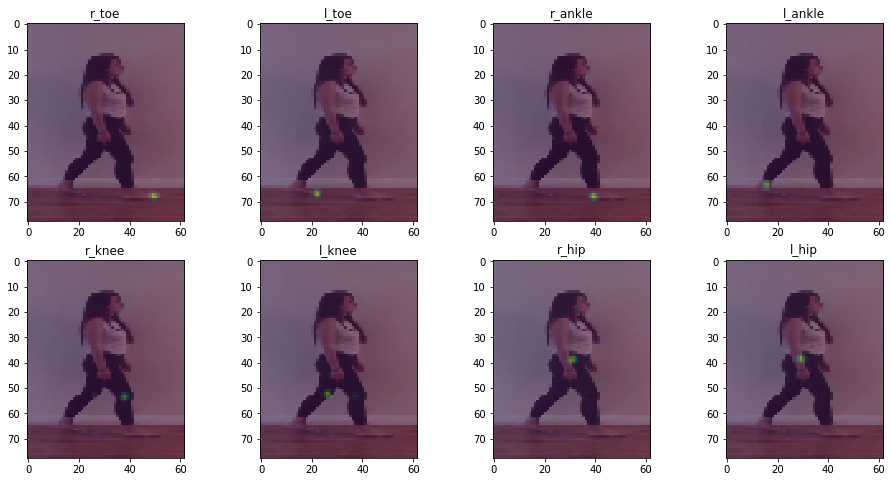

In [40]:
# Model Inference in new Images
base_path = "../data_rf/images"
filename = "testing.png"
yolo_detector = Yolo()
image_path = "{}/{}".format(base_path, filename)
imgcv = cv2.imread(image_path)

# extract input X
X, width_scale, height_scale, cutting_rect = yolo_detector.extract_person(imgcv)
X = cv2.cvtColor(img_to_array(X)/255, cv2.COLOR_BGR2RGB)
X = np.expand_dims(X, axis=0)
y_pred = model.predict(X)

ORDERED_LABELS = ['r_toe','l_toe','r_ankle','l_ankle','r_knee','l_knee','r_hip','l_hip']
f, ax = plt.subplots(2,4,figsize=(16,8))
XX = cv2.resize(X[0,:,:,:], dsize=(62,78), interpolation=cv2.INTER_CUBIC)
for joint_ind in range(8):
    ax[joint_ind//4][joint_ind%4].imshow(XX)
    ax[joint_ind//4][joint_ind%4].imshow(y_pred[0,:,:,joint_ind],alpha=0.4)
    ax[joint_ind//4][joint_ind%4].set_title('{}'.format(ORDERED_LABELS[joint_ind]))
plt.show()

## Decoding Model Predictions

Check this [reference](https://matplotlib.org/3.1.1/tutorials/intermediate/gridspec.html) for variable grid specs when plotting

Parsing ../darkflow/cfg/yolov2-tiny.cfg
Loading ../darkflow/bin/yolov2-tiny.weights ...
Successfully identified 44948600 bytes
Finished in 0.014184951782226562s
Model has a coco model name, loading coco labels.

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
       |        | input                            | (?, 416, 416, 3)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 416, 416, 16)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 208, 208, 16)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 208, 208, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 104, 104, 32)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 104, 104, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 52, 52, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 52, 52, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 26, 26, 128)
 Loa

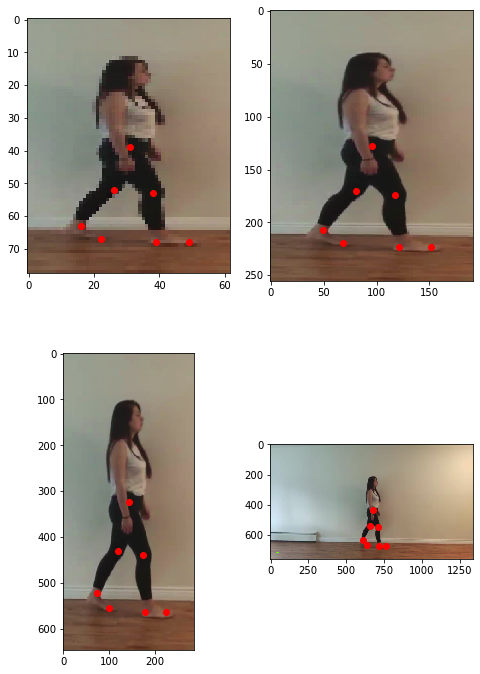

In [39]:
# Model Inference in new Images
base_path = "../data_rf/images"
filename = "testing.png"
yolo_detector = Yolo()
image_path = "{}/{}".format(base_path, filename)
imgcv = cv2.imread(image_path)

X, width_scale, height_scale, cutting_rect = yolo_detector.extract_person(imgcv)
X = cv2.cvtColor(img_to_array(X)/255, cv2.COLOR_BGR2RGB)
f, ax = plt.subplots(2,2,figsize=(8,12))
XX = cv2.resize(X, dsize=(62,78), interpolation=cv2.INTER_CUBIC)

for joint_ind in range(7):
    coords = np.where(y_pred==np.max(y_pred[0,:,:,joint_ind]))
    coords_0 = [coord[0] for coord in coords][1:3]
    coords_1 = np.dot(np.diag([256/78,192/62]),coords_0)
    coords_2 = np.dot(np.diag([1/height_scale,1/width_scale]),coords_1).astype(int)
    coords_3 = [cutting_rect[1]+coords_2[0],cutting_rect[0]+coords_2[1]]
    # Resolution 78 x 62
    ax[0][0].imshow(XX)
    ax[0][0].plot(coords_0[1],coords_0[0],'ro')
    # Resolution 256 x 192
    ax[0][1].imshow(X)
    ax[0][1].plot(coords_1[1],coords_1[0],'ro')
    # Original Resolution
    ax[1][0].imshow(cv2.cvtColor(img_to_array(array_to_img(imgcv).crop(cutting_rect)),cv2.COLOR_BGR2RGB)/255)
    ax[1][0].plot(coords_2[1],coords_2[0],'ro')
    # Original Coordinates
    ax[1][1].imshow(cv2.cvtColor(img_to_array(imgcv)/255, cv2.COLOR_BGR2RGB))
    ax[1][1].plot(coords_3[1],coords_3[0],'ro')
plt.show()

# One Leg Blind Gait estimation

## Data Collection

In [9]:
from keras.models import load_model
class PoseEstimator:
    #old weights: checkpoints/simple_baseline_weights-55-0.00001780-0.00005117.h5
    def __init__(self, model_path="checkpoints/simple_baseline_weights-47-0.00001083-0.00003969.h5"):
        self.yolo_detector = Yolo()
        self.model = load_model(model_path)
        self.ORDERED_LABELS = ['r_toe','l_toe','r_ankle','l_ankle','r_knee','l_knee','r_hip','l_hip']
        
    def estimate_pose(self, imgcv):
        """
        Example:
        --------
        >>> pose_estimator = PoseEstimator()
        >>> joint_coords = pose_estimator.estimate_pose(imgcv)
        >>> f, ax = plt.subplots(1,1,figsize=(16/1.5,9/1.5))
        >>> image = cv2.cvtColor(imgcv, cv2.COLOR_BGR2RGB)
        """
        X, width_scale, height_scale, cutting_rect = self.yolo_detector.extract_person(imgcv=imgcv)
        X = cv2.cvtColor(img_to_array(X)/255, cv2.COLOR_BGR2RGB)
        X = np.expand_dims(X, axis=0)
        # Running joint coords estimation
        y_pred_1 = self.model.predict(X)
        X_flip = np.flip(X,2)
        y_pred_2 = np.flip(self.model.predict(X_flip),2)
        y_pred = (y_pred_1 + y_pred_2)/2
        joint_coords = np.array([])        
        for joint_ind in range(8):
            # Respect Original Frame
            coords = np.where(y_pred==np.max(y_pred[0,:,:,joint_ind]))
            coords = [coord[0] for coord in coords][1:3]
            coords_1 = np.dot(np.diag([256/78,192/62]),coords)
            coords_2 = np.dot(np.diag([1/height_scale,1/width_scale]),coords_1).astype(int)
            coords = [cutting_rect[1]+coords_2[0],cutting_rect[0]+coords_2[1]]
            if len(joint_coords) == 0:
                joint_coords = [coords]
            else:
                joint_coords = np.vstack([joint_coords, [coords]])            
        return joint_coords

In [10]:
from numpy.linalg import norm
annotation_parser = AnnotationParser()
pose_estimator = PoseEstimator()

W0401 16:25:22.167094 47625905401536 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/build.py:105: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.



Parsing ../darkflow/cfg/yolov2-tiny.cfg
Loading ../darkflow/bin/yolov2-tiny.weights ...
Successfully identified 44948600 bytes
Finished in 0.024002552032470703s
Model has a coco model name, loading coco labels.

Building net ...


W0401 16:25:22.217535 47625905401536 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/ops/baseop.py:70: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.

W0401 16:25:22.218876 47625905401536 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/ops/baseop.py:71: The name tf.get_variable is deprecated. Please use tf.compat.v1.get_variable instead.

W0401 16:25:22.272280 47625905401536 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/ops/baseop.py:84: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.



Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------


W0401 16:25:22.432974 47625905401536 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/ops/simple.py:106: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



       |        | input                            | (?, 416, 416, 3)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 416, 416, 16)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 208, 208, 16)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 208, 208, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 104, 104, 32)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 104, 104, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 52, 52, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 52, 52, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 26, 26, 128)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 26, 26, 256)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 13, 13, 256)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 13, 13, 512)
 Load  |  Yep!  | maxp 2x2p0_1                     | (?, 13, 13, 512)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 13, 13, 1024)


W0401 16:25:23.394213 47625905401536 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/build.py:146: The name tf.global_variables_initializer is deprecated. Please use tf.compat.v1.global_variables_initializer instead.



 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 13, 13, 512)
 Load  |  Yep!  | conv 1x1p0_1    linear           | (?, 13, 13, 425)
-------+--------+----------------------------------+---------------
Running entirely on CPU


W0401 16:25:24.111343 47625905401536 module_wrapper.py:139] From /project/6014087/jchaconl/project/darkflow/darkflow/net/build.py:149: The name tf.train.Saver is deprecated. Please use tf.compat.v1.train.Saver instead.

W0401 16:25:24.402015 47625905401536 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:4185: The name tf.truncated_normal is deprecated. Please use tf.random.truncated_normal instead.



Finished in 2.1250102519989014s



W0401 16:25:24.452639 47625905401536 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:245: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0401 16:25:24.453631 47625905401536 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:1834: The name tf.nn.fused_batch_norm is deprecated. Please use tf.compat.v1.nn.fused_batch_norm instead.

W0401 16:25:30.535153 47625905401536 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0401 16:25:33.459625 47625905401536 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:199: The name tf.is_variable_initialized is deprecated. Please u

In [12]:
t0 = time()
video_names = ['VID_20200325_171448.mp4','VID_20200330_140612.mp4','VID_20200325_171938.mp4',
               'VID_20200330_141206.mp4']
base_video_path = '../data_rf/videos'
base_gait_annotation_path = '../data_rf/gait_annotations'
one = 0.999999

gait_details_df = pd.DataFrame({})
ORDERED_LABELS = ['r_toe','l_toe','r_ankle','l_ankle','r_knee','l_knee','r_hip','l_hip']

for video_name in video_names:
    annotation_file_name = '{}/{}_gait.xml'.format(base_gait_annotation_path, video_name.split('.mp4')[0])
    activities_df = annotation_parser.parse_activities_only(annotation_file_name)
    activities_df = activities_df.loc[activities_df['activity']!='none']
    frame_counters = activities_df.frame.values
    video_path = '{}/{}'.format(base_video_path,video_name)
    vid_cap = cv2.VideoCapture(video_path)
    activities_df.reset_index(inplace=True,drop=True)
    
    activities_df['shot']=pd.Series(np.cumsum(np.append([False],np.diff(activities_df['frame'])>1)))
    gait_details = []
    for frame_counter in frame_counters:
        print(frame_counter)
        vid_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_counter)
        ret, imgcv = vid_cap.read()
        joint_coords = pose_estimator.estimate_pose(imgcv)
        r_leg_coords = joint_coords[[0,2,4,6],:]
        l_leg_coords = joint_coords[[1,3,5,7],:]
        r_diff = np.diff(r_leg_coords,axis=0)
        l_diff = np.diff(l_leg_coords,axis=0)
        # Computing angles
        theta_r_ankle = np.arccos(-one*r_diff[0,1]/norm(r_diff[0,:]))
        theta_r_knee = np.arccos(-one*r_diff[1,1]/norm(r_diff[1,:]))
        theta_r_hip = np.arccos(-one*r_diff[2,1]/norm(r_diff[2,:]))
        theta_l_ankle = np.arccos(-one*l_diff[0,1]/norm(l_diff[0,:]))
        theta_l_knee = np.arccos(-one*l_diff[1,1]/norm(l_diff[1,:]))
        theta_l_hip = np.arccos(-one*l_diff[2,1]/norm(l_diff[2,:]))
        # Old coordinates (hip respect horizontal, knee real angle, ankle real angle)
        #theta_r_ankle = np.arccos(-one*np.dot(r_diff[0,:],r_diff[1,:])/(norm(r_diff[0,:])*norm(r_diff[1,:])))
        #theta_r_knee = np.arccos(-one*np.dot(r_diff[1,:],r_diff[2,:])/(norm(r_diff[1,:])*norm(r_diff[2,:])))
        #theta_r_hip = np.arccos(-one*r_diff[2,1]/norm(r_diff[2,:]))
        #theta_l_ankle = np.arccos(-one*np.dot(l_diff[0,:],l_diff[1,:])/(norm(l_diff[0,:])*norm(l_diff[1,:])))
        #theta_l_knee = np.arccos(-one*np.dot(l_diff[1,:],l_diff[2,:])/(norm(l_diff[1,:])*norm(l_diff[2,:])))
        #theta_l_hip = np.arccos(-one*l_diff[2,1]/norm(l_diff[2,:]))
        coords_dict = dict(zip(ORDERED_LABELS,joint_coords))
        angles_dict = {"theta_r_ankle": theta_r_ankle,
                       "theta_r_knee": theta_r_knee,
                       "theta_r_hip": theta_r_hip,
                       "theta_l_ankle": theta_l_ankle,
                       "theta_l_knee": theta_l_knee,
                       "theta_l_hip":theta_l_hip}
        gait_details.append({"frame":frame_counter,**coords_dict, **angles_dict})
        #Plotting
        #f, ax = plt.subplots(1,1,figsize=(8,8))
        #ax.imshow([[0,0,0]])
        #ax.plot(r_leg_coords[:,1],r_leg_coords[:,0],'*-')
        #ax.plot(l_leg_coords[:,1],l_leg_coords[:,0],'*-')
        #ax.axis('equal');
    gait_details_df_temp = pd.DataFrame(gait_details)
    gait_details_df_temp = activities_df.merge(gait_details_df_temp,on="frame")
    gait_details_df_temp['video_name']=video_name
    gait_details_df_temp['activity'] = activities_df['activity']
    gait_details_df = gait_details_df.append(gait_details_df_temp,ignore_index=True)
print('total time', time()-t0)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
579
580
581
582
583
58

/home/jchaconl/ensc813-project/lib/python3.6/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in double_scalars


8059
8060
8061
8062
8063
8064
8065
8066
8067
8068
8069
8070
8071
8072
8073
8074
8075
8076
8077
8078
8079
8080
8081
8082
8083
8084
8085
8086
8087
8088
8089
8090
8091
8092
8093
8094
8095
8096
8097
8098
8099
8100
8101
8102
8103
8104
8105
8106
8107
8108
8109
8110
8111
8112
8113
8114
8115
8116
8117
8118
8119
8120
8121
8122
8123
8124
8125
8126
8127
8128
8129
8130
8131
8132
8133
8134
8135
8136
8137
8138
8139
8140
8141
8142
8143
8144
8145
8146
8324
8325
8326
8327
8328
8329
8330
8331
8332
8333
8334
8335
8336
8337
8338
8339
8340
8341
8342
8343
8344
8345
8346
8347
8348
8349
8350
8351
8352
8353
8354
8355
8356
8357
8358
8359
8360
8361
8362
8363
8364
8365
8366
8367
8368
8369
8370
8371
8372
8373
8374
8375
8376
8377
8378
8379
8380
8381
8382
8383
8384
8385
8386
8387
8388
8389
8390
8391
8392
8393
8394
8395
8396
8397
8398
8399
8400
8401
8402
8403
8404
8405
8406
8407
8408
8409
8410
8411
8412
8413
8414
8415
8416
8417
8418
8419
8420
8421
8422
8423
8424
8425
8426
8427
8428
8429
8430
8431
8432
8433
8434
8435


/home/jchaconl/ensc813-project/lib/python3.6/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in double_scalars


8449
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8944
8945
8946
8947
8948
8949
8950
8951
8952
8953
8954
8955
8956
8957
8958
8959
8960
8961
8962
8963
8964
8965
8966
8967
8968
8969
8970
8971
8972
8973
8974
8975
8976
8977
8978
8979
8980
8981
8982
8983
8984
8985
8986
8987
8988
8989
8990
8991
8992
8993
8994
8995
8996
8997
8998
8999
9000
9001
9002
9003
9004
9005
9006
9007
9008
9009
9010
9011
9012
9013
9014
9015
9016
9017
9018
9019
9020
9021
9022
9023
9024
9025
total time 2524.1435198783875


In [13]:
gait_details_df.shape

(11583, 18)

In [32]:
frames_per_sec = frame_counters.shape[0]/11583 #3.1 frames per second!
print('frames per second: {}'.format(frames_per_sec))
#gait_details_df.to_pickle('../data_rf/gait_details.pkl')

frames per second: 0.3572476905810239


In [10]:
gait_details_df=pd.read_pickle('../data_rf/gait_details.pkl')

In [11]:
def filtering(df):
    cols = ['theta_r_ankle', 'theta_r_knee', 'theta_r_hip', 'theta_l_ankle', 'theta_l_knee', 'theta_l_hip' ]
    result = df[cols].rolling(31).apply(np.median,raw=True).dropna()
    result = df[['frame','activity','r_toe', 'l_toe', 'r_ankle', 'l_ankle', 
                 'r_knee', 'l_knee', 'r_hip', 'l_hip',]].merge(result,left_index=True,right_index=True)
    result.dropna(inplace=True)
    return result

In [12]:
#gait_details_df = gait_details_df.groupby(['video_name','shot']).apply(filtering)
#gait_details_df.reset_index(level=[0,1],inplace=True)

In [13]:
gait_details_df

,frame,activity,shot,r_toe,l_toe,r_ankle,l_ankle,r_knee,l_knee,r_hip,l_hip,theta_r_ankle,theta_r_knee,theta_r_hip,theta_l_ankle,theta_l_knee,theta_l_hip,video_name
0,0,walking,0,"[862, 151]","[840, 157]","[851, 91]","[806, 116]","[707, 96]","[696, 167]","[563, 65]","[563, 126]",0.181325,1.605505,1.358755,0.692336,2.004932,1.271769,VID_20200325_171448.mp4
1,1,walking,0,"[854, 149]","[843, 174]","[854, 94]","[809, 129]","[708, 99]","[696, 174]","[561, 74]","[561, 129]",0.001414,1.605029,1.402340,0.647049,1.949776,1.249046,VID_20200325_171448.mp4
2,2,walking,0,"[850, 154]","[850, 188]","[850, 94]","[817, 139]","[716, 104]","[693, 183]","[559, 79]","[559, 134]",0.001414,1.645285,1.412887,0.592699,1.911775,1.220229,VID_20200325_171448.mp4
3,3,walking,0,"[852, 149]","[852, 209]","[852, 94]","[829, 154]","[716, 104]","[693, 189]","[557, 79]","[557, 139]",0.001414,1.644194,1.414841,0.396084,1.822683,1.218488,VID_20200325_171448.mp4
4,4,walking,0,"[869, 153]","[846, 224]","[857, 92]","[834, 173]","[719, 102]","[685, 194]","[558, 86]","[558, 143]",0.194246,1.643134,1.471743,0.231095,1.710814,1.188933,VID_20200325_171448.mp4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11578,9021,running,19,"[937, 241]","[937, 133]","[914, 291]","[902, 191]","[783, 241]","[772, 133]","[629, 266]","[618, 208]",2.710452,1.206183,1.731730,2.598640,1.151146,2.024000,VID_20200330_141206.mp4
11579,9022,running,19,"[935, 245]","[935, 90]","[911, 294]","[911, 147]","[779, 237]","[767, 114]","[623, 245]","[623, 196]",2.686140,1.163165,1.622033,2.743068,1.345520,2.088445,VID_20200330_141206.mp4
11580,9023,running,19,"[935, 246]","[923, 47]","[911, 286]","[911, 111]","[778, 230]","[766, 95]","[622, 230]","[622, 182]",2.601171,1.172274,1.570796,2.956239,1.460896,2.114273,VID_20200330_141206.mp4
11581,9024,running,19,"[940, 244]","[917, 15]","[905, 289]","[905, 83]","[778, 221]","[766, 83]","[627, 213]","[615, 160]",2.480548,1.079206,1.517866,2.966915,1.570796,2.042359,VID_20200330_141206.mp4


In [14]:
def delay_theta_columns(df, periods, theta_columns):
    for period in periods:
        result = (df[theta_columns]).shift(period)
        df = df.merge(result, suffixes=('','_{}'.format(period)),left_index=True, right_index=True)
    return df

In [15]:
theta_columns = ['theta_r_ankle', 'theta_r_knee', 'theta_r_hip', 
                 'theta_l_ankle', 'theta_l_knee', 'theta_l_hip']
theta_columns = ['theta_r_ankle', 'theta_r_knee', 'theta_r_hip']
theta_columns = ['theta_r_hip', 'theta_l_hip']

In [16]:
delayed_gait_details_df = gait_details_df.groupby(['video_name','shot']).apply(lambda x: delay_theta_columns(x,np.arange(1,31),theta_columns))

In [17]:
delayed_gait_details_df.dropna(inplace=True)

In [18]:
import re
r_regex = re.compile(r'\w+_r_(\w+)_(\d+)')
r_regex = re.compile(r'\w+_r_(\w+)((\_\d)*)')
r_regex = re.compile(r'\w+_hip_(\w+)((\_\d)*)')
X_cols = [col for col in delayed_gait_details_df.columns if type(re.match(r_regex, col))!=type(None)]
#X_cols = [*X_cols, 'theta_l_ankle', 'theta_l_knee', 'theta_l_hip'] #!Important fix it!!!! it is only for checking purposes
#X_cols = [*X_cols, 'theta_l_hip','theta_r_hip', 'theta_l_ankle','theta_r_ankle','theta_l_knee','theta_r_knee']
X_cols = [*X_cols, 'theta_l_hip','theta_r_hip']
y_cols = ['theta_l_ankle', 'theta_r_ankle', 'theta_l_knee','theta_r_knee']
X = delayed_gait_details_df[X_cols]
y = delayed_gait_details_df[y_cols]

In [19]:
train_index = delayed_gait_details_df['shot']!=1
test_index = delayed_gait_details_df['shot']==1
X_train_df = X.loc[train_index]
X_test_df = X.loc[test_index]
y_train_df = y.loc[train_index]
y_test_df = y.loc[test_index]
gait_details_train_df = delayed_gait_details_df.loc[train_index, gait_details_df.columns]
gait_details_test_df = delayed_gait_details_df.loc[test_index, gait_details_df.columns]

In [20]:
# normalize features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
#X_train_values = scaler.fit_transform(X_train_df.values)
#X_test_values = scaler.transform(X_test_df.values)
X_train_values = X_train_df.values
X_test_values = X_test_df.values
# reshape features
X_train = X_train_values.reshape((X_train_df.shape[0], 1, X_train_df.shape[1]))
X_test = X_test_df.values.reshape((X_test_df.shape[0], 1, X_test_df.shape[1]))
y_train = y_train_df.values
y_test = y_test_df.values

the inputs (X) are reshaped into the 3D format expected by LSTMs, namely [samples, timesteps, features].

In [21]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(8634, 1, 62) (1268, 1, 62) (8634, 4) (1268, 4)


In [68]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

def model_gait_generator(model_name='LSTM_single_layer'):
    if model_name == 'linear':
        model_gait = Sequential()
        model_gait.add(Dense(y_train.shape[1],input_shape=(X_train.shape[1], X_train.shape[2])))
        model_gait.compile(loss='mse', optimizer='adam')
        return model_gait
    if model_name == 'LSTM_single_layer':
        model_gait = Sequential()
        model_gait.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2])))
        model_gait.add(Dense(y_train.shape[1]))
        model_gait.compile(loss='mse', optimizer='adam')
        return model_gait
    if model_name == 'LSTM_multi_layer':
        model_gait = Sequential()        
        model_gait.add(LSTM(20, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
        model_gait.add(LSTM(10, return_sequences=True))
        model_gait.add(LSTM(10))
        model_gait.add(Dense(y_train.shape[1]))
        model_gait.compile(loss='mse', optimizer='adam')
        return model_gait

In [77]:
# fit LSTM_single_layer
model_gait_linear = model_gait_generator(model_name='linear')
history_linear = model_gait_linear.fit(X_train, np.expand_dims(y_train,1), epochs=200, batch_size=32, validation_data=(X_test, np.expand_dims(y_test,1)), verbose=2, shuffle=True)

W0401 21:29:12.785245 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.

W0401 21:29:12.846014 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:973: The name tf.assign is deprecated. Please use tf.compat.v1.assign instead.

W0401 21:29:12.890568 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:199: The name tf.is_variable_initialized is deprecated. Please use tf.compat.v1.is_variable_initialized instead.



Train on 8634 samples, validate on 1268 samples
Epoch 1/200


W0401 21:29:13.990287 47986160213696 module_wrapper.py:139] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:206: The name tf.variables_initializer is deprecated. Please use tf.compat.v1.variables_initializer instead.



 - 7s - loss: 0.8370 - val_loss: 0.7366
Epoch 2/200
 - 1s - loss: 0.6562 - val_loss: 0.8100
Epoch 3/200
 - 1s - loss: 0.6265 - val_loss: 0.6447
Epoch 4/200
 - 1s - loss: 0.6036 - val_loss: 0.7151
Epoch 5/200
 - 1s - loss: 0.5847 - val_loss: 0.6391
Epoch 6/200
 - 1s - loss: 0.5702 - val_loss: 0.7247
Epoch 7/200
 - 1s - loss: 0.5547 - val_loss: 0.6312
Epoch 8/200
 - 1s - loss: 0.5411 - val_loss: 0.6215
Epoch 9/200
 - 1s - loss: 0.5277 - val_loss: 0.5812
Epoch 10/200
 - 1s - loss: 0.5185 - val_loss: 0.6776
Epoch 11/200
 - 1s - loss: 0.5087 - val_loss: 0.5152
Epoch 12/200
 - 1s - loss: 0.4967 - val_loss: 0.5660
Epoch 13/200
 - 1s - loss: 0.4881 - val_loss: 0.5977
Epoch 14/200
 - 1s - loss: 0.4796 - val_loss: 0.6698
Epoch 15/200
 - 1s - loss: 0.4704 - val_loss: 0.5059
Epoch 16/200
 - 1s - loss: 0.4628 - val_loss: 0.5934
Epoch 17/200
 - 1s - loss: 0.4543 - val_loss: 0.5968
Epoch 18/200
 - 1s - loss: 0.4467 - val_loss: 0.7197
Epoch 19/200
 - 1s - loss: 0.4399 - val_loss: 0.5918
Epoch 20/200
 

In [78]:
# fit LSTM_single_layer
model_gait_single = model_gait_generator(model_name='LSTM_single_layer')
history_single = model_gait_single.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test), verbose=2, shuffle=True)

W0401 21:31:29.185238 47986160213696 deprecation.py:323] From /home/jchaconl/ensc813-project/lib/python3.6/site-packages/tensorflow_core/python/ops/math_grad.py:1424: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 8634 samples, validate on 1268 samples
Epoch 1/200
 - 3s - loss: 0.5841 - val_loss: 0.4209
Epoch 2/200
 - 2s - loss: 0.3274 - val_loss: 0.5142
Epoch 3/200
 - 1s - loss: 0.2673 - val_loss: 0.2593
Epoch 4/200
 - 1s - loss: 0.2423 - val_loss: 0.2689
Epoch 5/200
 - 1s - loss: 0.2214 - val_loss: 0.2511
Epoch 6/200
 - 2s - loss: 0.2156 - val_loss: 0.4409
Epoch 7/200
 - 1s - loss: 0.2110 - val_loss: 0.3094
Epoch 8/200
 - 1s - loss: 0.2061 - val_loss: 0.2218
Epoch 9/200
 - 1s - loss: 0.2066 - val_loss: 0.2806
Epoch 10/200
 - 1s - loss: 0.2017 - val_loss: 0.3628
Epoch 11/200
 - 1s - loss: 0.2029 - val_loss: 0.2151
Epoch 12/200
 - 1s - loss: 0.1997 - val_loss: 0.3933
Epoch 13/200
 - 1s - loss: 0.1962 - val_loss: 0.1828
Epoch 14/200
 - 1s - loss: 0.1972 - val_loss: 0.3051
Epoch 15/200
 - 1s - loss: 0.1972 - val_loss: 0.1693
Epoch 16/200
 - 1s - loss: 0.1906 - val_loss: 0.1983
Epoch 17/200
 - 1s - loss: 0.1960 - val_loss: 0.1939
Epoch 18/200
 - 1s - loss: 0.1904 - val_loss: 0.2233
Epoch 1

In [79]:
# fit LSTM_single_layer
model_gait_multi = model_gait_generator(model_name='LSTM_multi_layer')
history_multi = model_gait_multi.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test), verbose=2, shuffle=True)

Train on 8634 samples, validate on 1268 samples
Epoch 1/200
 - 7s - loss: 1.3844 - val_loss: 1.1149
Epoch 2/200
 - 4s - loss: 0.7731 - val_loss: 0.8373
Epoch 3/200
 - 4s - loss: 0.5963 - val_loss: 0.7417
Epoch 4/200
 - 4s - loss: 0.3519 - val_loss: 0.8041
Epoch 5/200
 - 4s - loss: 0.2611 - val_loss: 0.8010
Epoch 6/200
 - 4s - loss: 0.2328 - val_loss: 0.2525
Epoch 7/200
 - 4s - loss: 0.2299 - val_loss: 0.3010
Epoch 8/200
 - 4s - loss: 0.2186 - val_loss: 0.2565
Epoch 9/200
 - 4s - loss: 0.2110 - val_loss: 0.5270
Epoch 10/200
 - 4s - loss: 0.2106 - val_loss: 0.2510
Epoch 11/200
 - 4s - loss: 0.1993 - val_loss: 0.2941
Epoch 12/200
 - 4s - loss: 0.1830 - val_loss: 0.1835
Epoch 13/200
 - 4s - loss: 0.1741 - val_loss: 0.3189
Epoch 14/200
 - 4s - loss: 0.1743 - val_loss: 0.2154
Epoch 15/200
 - 4s - loss: 0.1620 - val_loss: 0.1487
Epoch 16/200
 - 4s - loss: 0.1606 - val_loss: 0.1437
Epoch 17/200
 - 4s - loss: 0.1552 - val_loss: 0.1828
Epoch 18/200
 - 4s - loss: 0.1593 - val_loss: 0.1809
Epoch 1

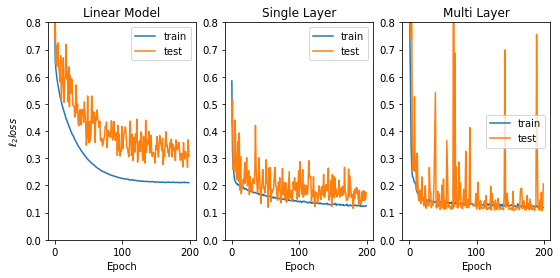

In [87]:
f, ax = plt.subplots(1,3,figsize=(9,4))
ax[0].plot(history_linear.history['loss'], label='train')
ax[0].plot(history_linear.history['val_loss'], label='test')
ax[0].set_ylim(0,0.8)
ax[0].legend()
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel(r'$\ell_{2}loss$')
ax[0].set_title('Linear Model')
ax[1].plot(history_single.history['loss'], label='train')
ax[1].plot(history_single.history['val_loss'], label='test')
ax[1].set_ylim(0,0.8)
ax[1].legend()
ax[1].set_xlabel('Epoch')
ax[1].set_title('Single Layer')
ax[2].plot(history_multi.history['loss'], label='train')
ax[2].plot(history_multi.history['val_loss'], label='test')
ax[2].set_ylim(0,0.8)
ax[2].legend()
ax[2].set_xlabel('Epoch')
ax[2].set_title('Multi Layer')
#plt.tight_layout()
f.savefig('figs/LSTM_training_results.png')

In [93]:
from keras.utils import plot_model

In [94]:
plot_model(model_gait_multi)

In [95]:
# Plotting gait

In [105]:
from sklearn.metrics import mean_squared_error
y_test_pred = model_gait_multi.predict(X_test)
y_train_pred = model_gait_multi.predict(X_train)
mean_squared_error(y_test, y_test_pred)

0.20584164932252627

<IPython.core.display.Javascript object>


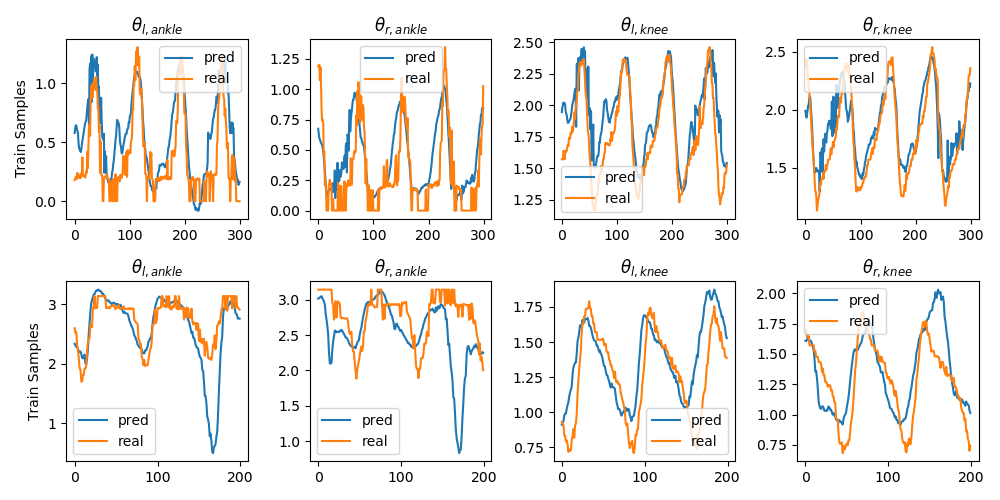

In [106]:
%matplotlib notebook
f, ax = plt.subplots(2,4,figsize=(10,5))
# Train Plots
w = 300
ax[0][0].set_ylabel('Train Samples')
ax[0][0].plot(y_train_pred[:w,0])
ax[0][0].plot(y_train[:w,0])
ax[0][0].legend(['pred','real'])
ax[0][0].set_title(r'$\theta_{l,ankle}$')
ax[0][1].plot(y_train_pred[:w,1])
ax[0][1].plot(y_train[:w,1])
ax[0][1].legend(['pred','real'])
ax[0][1].set_title(r'$\theta_{r,ankle}$')
ax[0][2].plot(y_train_pred[:w,2])
ax[0][2].plot(y_train[:w,2])
ax[0][2].legend(['pred','real'])
ax[0][2].set_title(r'$\theta_{l,knee}$')
ax[0][3].plot(y_train_pred[:w,3])
ax[0][3].plot(y_train[:w,3])
ax[0][3].legend(['pred','real'])
ax[0][3].set_title(r'$\theta_{r,knee}$')
# Test Plots
w = 200
ax[1][0].set_ylabel('Train Samples')
ax[1][0].plot(y_test_pred[:w,0])
ax[1][0].plot(y_test[:w,0])
ax[1][0].legend(['pred','real'])
ax[1][0].set_title(r'$\theta_{l,ankle}$')
ax[1][1].plot(y_test_pred[:w,1])
ax[1][1].plot(y_test[:w,1])
ax[1][1].legend(['pred','real'])
ax[1][1].set_title(r'$\theta_{r,ankle}$')
ax[1][2].plot(y_test_pred[:w,2])
ax[1][2].plot(y_test[:w,2])
ax[1][2].legend(['pred','real'])
ax[1][2].set_title(r'$\theta_{l,knee}$')
ax[1][3].plot(y_test_pred[:w,3])
ax[1][3].plot(y_test[:w,3])
ax[1][3].legend(['pred','real'])
ax[1][3].set_title(r'$\theta_{r,knee}$')
plt.tight_layout()

In [108]:
video_name = 'VID_20200325_171938.mp4'
base_video_path = '../data_rf/videos'
base_gait_annotation_path = '../data_rf/gait_annotations'
one = 0.999999

gait_details_df = pd.DataFrame({})
ORDERED_LABELS = ['r_toe','l_toe','r_ankle','l_ankle','r_knee','l_knee','r_hip','l_hip']

annotation_file_name = '{}/{}.xml'.format(base_gait_annotation_path, video_name.split('.mp4')[0])
#activities_df = annotation_parser.parse_activities_only(annotation_file_name)
#activities_df = activities_df.loc[activities_df['activity']!='none']
#frame_counters = activities_df.frame.values
video_path = '{}/{}'.format(base_video_path,video_name)
vid_cap = cv2.VideoCapture(video_path)
from numpy.linalg import norm

In [109]:
%matplotlib inline

/home/jchaconl/ensc813-project/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


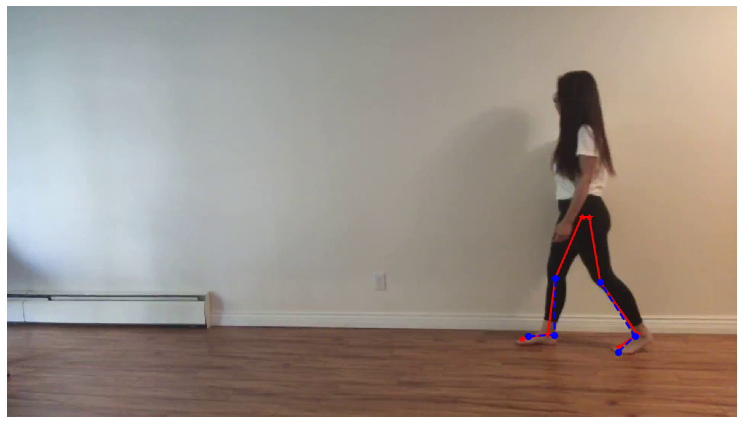

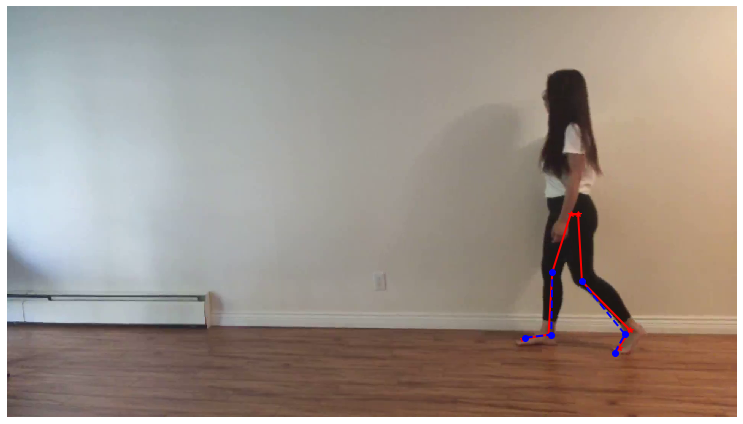

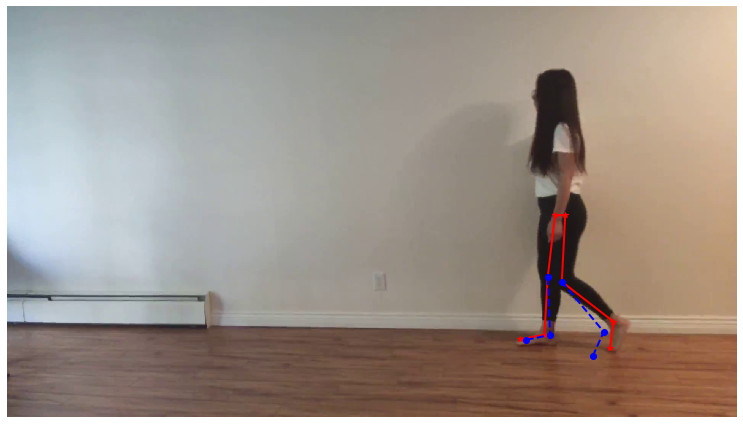

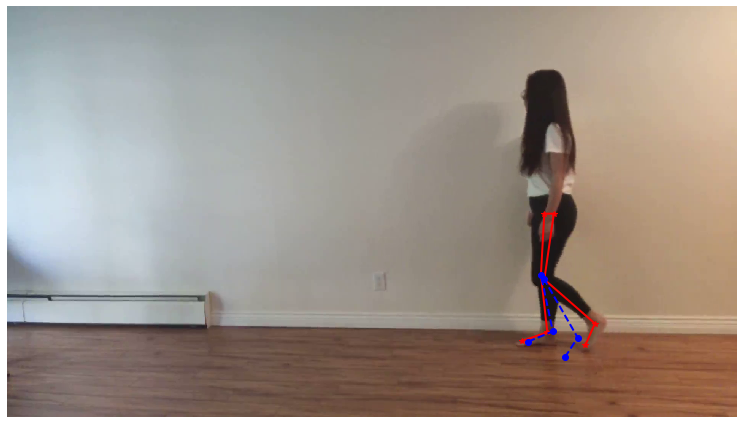

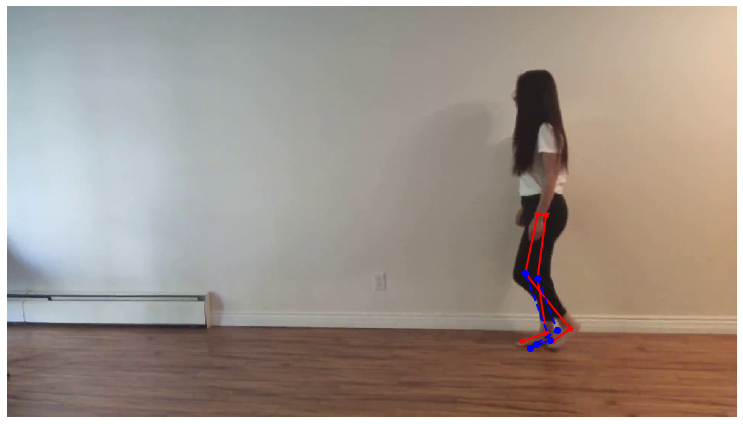

...

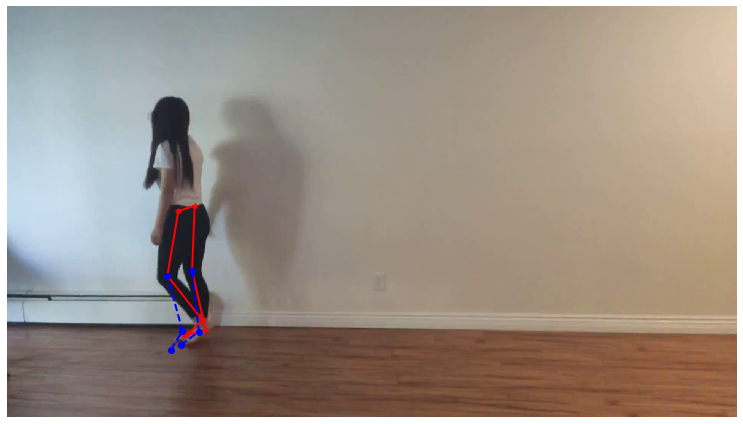

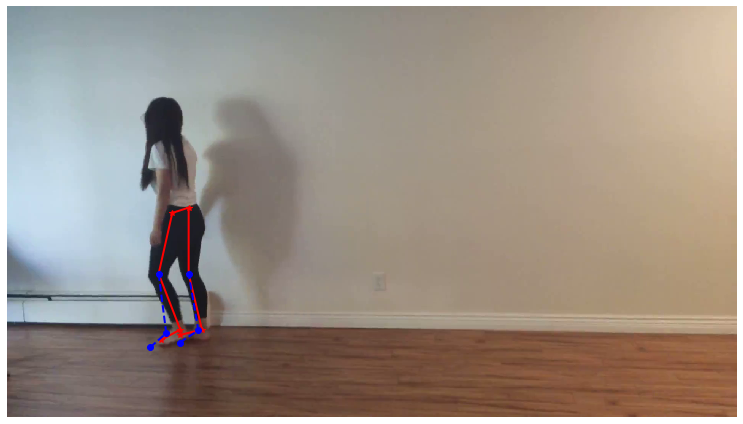

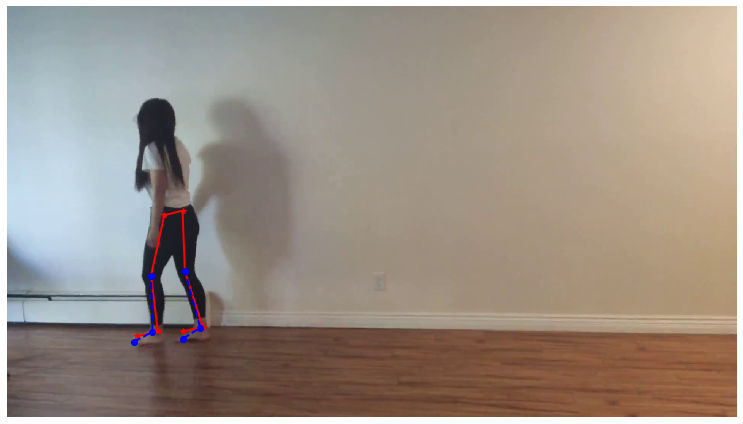

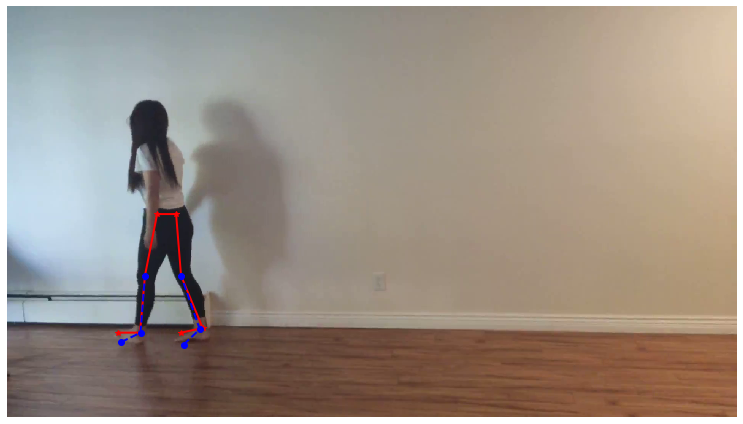

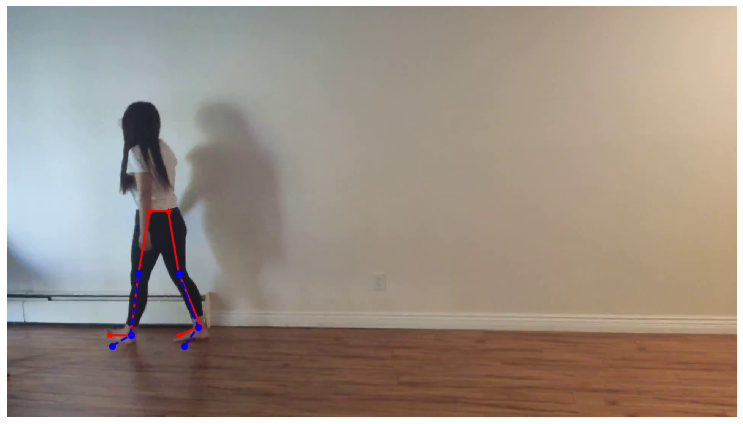

In [111]:
# Making a .gif of the predictions
import imageio
images = []

counter = -1
for frame_counter in gait_details_test_df['frame'].loc[gait_details_test_df['video_name']==video_name].values[:200]:
    counter += 1
    if counter%4==0:
        f, ax = plt.subplots(1,1,figsize=(16/1.5,9/1.5))
        if not vid_cap.isOpened():
            vid_cap = cv2.VideoCapture(video_path)
        vid_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_counter)
        ret, imgcv = vid_cap.read()
        frame_mask = (gait_details_test_df['frame']==frame_counter)&(gait_details_test_df['video_name']==video_name)
        joint_coords = np.vstack(gait_details_test_df.loc[frame_mask,ORDERED_LABELS].values[0])
        image = cv2.cvtColor(imgcv, cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        sorted_joints = [0,2,4,6,7,5,3,1]
        foot_len_l = norm(joint_coords[3,:] - joint_coords[1,:])
        shank_len_l = norm(joint_coords[5,:] - joint_coords[3,:])
        thigh_len_l = norm(joint_coords[7,:] - joint_coords[5,:])
        foot_len_r = norm(joint_coords[2,:] - joint_coords[0,:])
        shank_len_r = norm(joint_coords[4,:] - joint_coords[2,:])
        thigh_len_r = norm(joint_coords[6,:] - joint_coords[4,:])
        # Plotting joints based on filtered thetas
        theta_r = gait_details_test_df.loc[frame_mask,['theta_r_ankle','theta_r_knee','theta_r_hip']].values
        theta_l = gait_details_test_df.loc[frame_mask,['theta_l_ankle','theta_l_knee','theta_l_hip']].values
        r_hip = joint_coords[6]
        r_knee = r_hip + thigh_len_r*np.array([np.sin(theta_r[0,2]),np.cos(theta_r[0,2])])
        r_ankle = r_knee + shank_len_r*np.array([np.sin(theta_r[0,1]),np.cos(theta_r[0,1])])
        r_toe = r_ankle + foot_len_r*np.array([np.sin(theta_r[0,0]),np.cos(theta_r[0,0])])
        l_hip = joint_coords[7]
        l_knee = l_hip + thigh_len_l*np.array([np.sin(theta_l[0,2]),np.cos(theta_l[0,2])])
        l_ankle = l_knee + shank_len_l*np.array([np.sin(theta_l[0,1]),np.cos(theta_l[0,1])])
        l_toe = l_ankle + foot_len_l*np.array([np.sin(theta_l[0,0]),np.cos(theta_l[0,0])])
        #a_coords = np.array([r_toe, l_toe, r_ankle, l_ankle, r_knee, l_knee, r_hip, l_hip])
        #ax.plot(a_coords[sorted_joints,1],a_coords[sorted_joints,0],'r.-',linewidth=2)
        
        ax.plot(joint_coords[sorted_joints,1],joint_coords[sorted_joints,0],'r*-',linewidth=2)
        #### Predictions
        x_mask = (gait_details_test_df['frame']==frame_counter)&(gait_details_test_df['video_name']==video_name)
        x_df = X_test_df.loc[x_mask]
        x = x_df.values.reshape((x_df.shape[0], 1, x_df.shape[1]))
        theta_columns = ['theta_l_ankle', 'theta_r_ankle', 'theta_l_knee','theta_r_knee']
        y_pred = model_gait_single.predict(x)
        #y_pred = gait_details_test_df.loc[gait_details_test_df['frame']==frame_counter,['theta_l_ankle','theta_l_knee','theta_l_hip']].values
        l_hip = joint_coords[7]
        l_knee = l_hip + thigh_len_l*np.array([np.sin(theta_l[0,2]),np.cos(theta_l[0,2])])
        l_ankle = l_knee + shank_len_l*np.array([np.sin(y_pred[0,2]),np.cos(y_pred[0,2])])
        l_toe = l_ankle + foot_len_l*np.array([np.sin(y_pred[0,0]),np.cos(y_pred[0,0])])
        r_hip = joint_coords[6]
        r_knee = r_hip + thigh_len_r*np.array([np.sin(theta_r[0,2]),np.cos(theta_r[0,2])])
        r_ankle = r_knee + shank_len_r*np.array([np.sin(y_pred[0,3]),np.cos(y_pred[0,3])])
        r_toe = r_ankle + foot_len_r*np.array([np.sin(y_pred[0,1]),np.cos(y_pred[0,1])])
        # Old articulation system (hip respect horizontal line, knee angle and ankle angle)
        #l_hip = joint_coords[7]
        #l_knee = l_hip + thigh_len*np.array([np.sin(y_pred[0,2]),np.cos(y_pred[0,2])])
        #l_ankle = l_knee - shank_len*np.array([np.sin(y_pred[0,1]+y_pred[0,2]),np.cos(y_pred[0,1]+y_pred[0,2])])
        #l_toe = l_ankle + foot_len*np.array([np.sin(y_pred[0,0]-y_pred[0,1]-y_pred[0,2]+np.pi),-np.cos(y_pred[0,0]-y_pred[0,1]-y_pred[0,2]-np.pi)])
        predicted_joint_coords = np.array([r_toe, l_toe, r_ankle, l_ankle, r_knee, l_knee, r_hip, l_hip])
        ######
        sorted_joints_r = [0,2,4]
        sorted_joints_l = [1,3,5]
        ax.plot(predicted_joint_coords[sorted_joints_r,1],predicted_joint_coords[sorted_joints_r,0],'bo--',linewidth=2)
        ax.plot(predicted_joint_coords[sorted_joints_l,1],predicted_joint_coords[sorted_joints_l,0],'bo--',linewidth=2)
        ax.set_axis_off()
        plt.tight_layout()
        f.savefig('figs/video_temp.jpeg',pad_inches=0,bbox_inches='tight')
        images.append(imageio.imread('figs/video_temp.jpeg'))
imageio.mimsave('figs/lore_pred.gif', images, duration=0.5)

# Saving some figures

In [73]:
annotation_parser = AnnotationParser()
annotation_file_name = '{}/{}.xml'.format(base_gait_annotation_path, video_name.split('.mp4')[0])
activities_df = annotation_parser.parse_activities_only(annotation_file_name)
activities_df = activities_df.loc[activities_df['activity']!='none']
frame_counters = activities_df.frame.values

In [248]:
# Making a .gif
import imageio
pose_estimator = PoseEstimator()
images = []

counter = 0
for frame_counter in frame_counters[range(270)]:
    counter += 1
    if counter%8==0:
        f, ax = plt.subplots(1,1,figsize=(16/1.5,9/1.5))
        if not vid_cap.isOpened():
            vid_cap = cv2.VideoCapture(video_path)
        vid_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_counter)
        ret, imgcv = vid_cap.read()
        joint_coords = pose_estimator.estimate_pose(imgcv)
        image = cv2.cvtColor(imgcv, cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        sorted_joints = [0,2,4,6,7,5,3,1]
        ax.plot(joint_coords[sorted_joints,1],joint_coords[sorted_joints,0],'r.-',linewidth=2)
        ax.set_axis_off()
        #plt.tight_layout()
        f.savefig('figs/video_temp.jpeg',pad_inches=0,bbox_inches='tight')
        images.append(imageio.imread('figs/video_temp.jpeg'))
imageio.mimsave('figs/lore.gif', images)

Parsing ../darkflow/cfg/yolov2-tiny.cfg
Loading ../darkflow/bin/yolov2-tiny.weights ...
Successfully identified 44948600 bytes
Finished in 0.03836178779602051s
Model has a coco model name, loading coco labels.

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
       |        | input                            | (?, 416, 416, 3)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 416, 416, 16)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 208, 208, 16)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 208, 208, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 104, 104, 32)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 104, 104, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 52, 52, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 52, 52, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 26, 26, 128)
 Load

KeyboardInterrupt: 